* **Courses:** Fall 2022-IE 532-Analysis of Network Data-Section AN
* **Topic:** Homework_3
* **Student name:**  Chen Wang
* **collaborators:** Jo-Ting Wang/Jasmine Chao

# Table of contents

1. Question 1
    - [Question 1a](#Question1a)
    - [Question 1b](#Question1b)
    - [Question 1c](#Question1c)
2. Question 2
    - [Question 2a](#Question2a)
    - [Question 2b](#Question2b)
3. Question 3
    - [Question 3a](#Question3a)
    - [Question 3b](#Question3b)
    - [Question 3c](#Question3c)
4. Question 4
    - [Question 4a](#Question4a)
    - [Question 4b](#Question4b)
    - [Question 4c](#Question4c)

In [2]:
import networkx as nx
import matplotlib.pyplot as plt
from gurobipy import *
from itertools import combinations
import heapq as hq
from random import sample
import pandas as pd
import math
import csv
import numpy as np

import warnings
warnings.filterwarnings("ignore")

plt.rcParams['figure.figsize'] = [4, 4] ## set the size of all figures

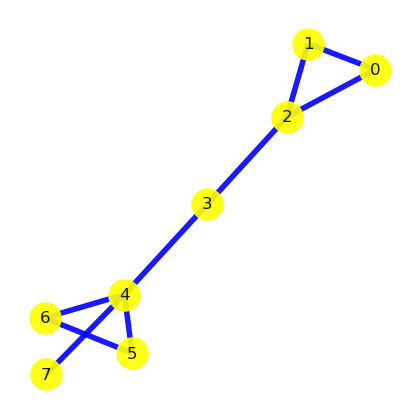

In [230]:
## Define a graph G
G = nx.Graph()
node_tuple = [(0,1), (0,2), (1,2), (2,3), (3,4), (4,5), (5,6), (4,6), (4,7)]
G.add_edges_from(node_tuple)
pos=nx.spring_layout(G)
nx.draw(G,pos, with_labels=True, node_size=500,  node_color='yellow', alpha = 0.9, edge_color = "blue", width = 4)

# Question 1_a <a name = "Question1a"></a>

#### Define degree centrality:
Define a node i, its degree $d_{i}$ will be:
$$d_{i} = |N_{i}|$$
if normalized $d_{i}$:
$$d_{normal_{i}} = \frac{|N_{i}|}{|V_{total}| - 1}$$
Therefore, using the above graph G as an example:
- node0: $d_{0} = |N_{0}|$ = 2 (node 1 and node 2),  $d_{normal_{0}} = \frac{2}{(7-1)} = \frac{1}{3} $
- node1: $d_{1} = |N_{1}|$ = 2 (node 0 and node 2),  $d_{normal_{1}} = \frac{2}{(7-1)} = \frac{1}{3} $
- node2: $d_{2} = |N_{2}|$ = 3 (node 0, node 1 and node3),  $d_{normal_{2}} = \frac{3}{(7-1)} = \frac{1}{2} = 0.5 $
- node3: $d_{3} = |N_{3}|$ = 2 (node 2 and node 4),  $d_{normal_{3}} = \frac{2}{(7-1)} = \frac{1}{3} $
- node4: $d_{4} = |N_{4}|$ = 3 (node 3, node 5 and node6),  $d_{normal_{4}} = \frac{3}{(7-1)} = \frac{1}{2} = 0.5 $
- node5: $d_{5} = |N_{5}|$ = 2 (node 4 and node 6),  $d_{normal_{5}} = \frac{2}{(7-1)} = \frac{1}{3} $
- node6: $d_{6} = |N_{6}|$ = 2 (node 4 and node 5),  $d_{normal_{6}} = \frac{2}{(7-1)} = \frac{1}{3} $

In [231]:
deg=nx.degree_centrality(G)
deg

deg_vis = pd.DataFrame(deg.items(), columns = ["node", "degree centrality"])
deg_vis["degree centrality"] = round(deg_vis["degree centrality"], 2)
deg_vis

,node,degree centrality
0,0,0.29
1,1,0.29
2,2,0.43
3,3,0.29
4,4,0.57
5,5,0.29
6,6,0.29
7,7,0.14


#### Define betweenness centrality:
Define a node i, its degree $b_{i}$ will be:
$$b_{i} = \frac{\sum_{s\in V, t\in V, v \notin {s,t}}\sigma_{st}({v})}{\sum_{s\in V, t\in V}\sigma_{st}}$$
Therefore, using the above graph G as an example:
$${\sum_{s\in V, t\in V}\sigma_{st}} = \frac{(n-1)(n-2)}{2} = \frac{(6)(5)}{2} = 15$$  
- node0: $b_{0}$ = 0 ( edge node = 0)
- node1: $b_{1}$ = 0 ( edge node = 0)
- node2: $\sum_{s\in V, t\in V, v \notin {s,t}}\sigma_{st}({v})$ = 8 (node3$\rightarrow$node0, node3$\rightarrow$node1, node4$\rightarrow$node0, node4$\rightarrow$node1, node5$\rightarrow$node0, node5$\rightarrow$node1, node6$\rightarrow$node0, node6$\rightarrow$node1), $b_{2}$ = $8 \above 1pt 15$
- node3: $\sum_{s\in V, t\in V, v \notin {s,t}}\sigma_{st}({v})$ = 9 (node4$\rightarrow$node0, node4$\rightarrow$node1, node4$\rightarrow$node2, node5$\rightarrow$node0, node5$\rightarrow$node1, node5$\rightarrow$node2, node6$\rightarrow$node0, node6$\rightarrow$node1, node6$\rightarrow$node2) $b_{3}$ = $9 \above 1pt 15$
- node4: $\sum_{s\in V, t\in V, v \notin {s,t}}\sigma_{st}({v})$ = 8 (node5$\rightarrow$node0, node5$\rightarrow$node1, node5$\rightarrow$node2, node5$\rightarrow$node3, node6$\rightarrow$node0, node6$\rightarrow$node1, node6$\rightarrow$node3, node6$\rightarrow$node3) $b_{4}$ = $8 \above 1pt 15$
- node5: $b_{5}$ = 0 (edge node = 0)
- node6: $b_{6}$ = 0 (edge node = 0)


In [232]:
between=nx.betweenness_centrality(G)
between

between_vis = pd.DataFrame(between.items(), columns = ["node", "betweenness centrality"])
between_vis["betweenness centrality"] = round(between_vis["betweenness centrality"], 2)
between_vis

,node,betweenness centrality
0,0,0.00
1,1,0.00
2,2,0.48
3,3,0.57
4,4,0.67
5,5,0.00
6,6,0.00
7,7,0.00


#### Define closeness centrality:
Given a node i, the definition of $c_{i}$ is the sum of all the shortest path from j to i $d_{ij}$ will be :
$$c_{i} = \sum_{i, j\in V,  j \notin i}d_{ij}$$
If we normalized it, it will be:
Therefore, using the above graph G as an example:
$$c_{normal_{i}} = \frac{(n-1)}{\sum_{i, j\in V,  j \notin i}d_{ij}}$$
- node0: $\sum_{j\in V, i\in {0},  j \notin i}d_{ij}$ = 15 (1 (1 $\rightarrow$ 0) + 1(2 $\rightarrow$ 0) + 2(3 $\rightarrow$ 0) + 3(4 $\rightarrow$ 0) + 4(5 $\rightarrow$ 0) + 4(6 $\rightarrow$ 0), $c_{normal_{0}}$ = $\frac{(7-1)}{15}$ = 0.4
- node1: $\sum_{j\in V, i\in {1},  j \notin i}d_{ij}$ = 15 (1 (0 $\rightarrow$ 1) + 1(2 $\rightarrow$ 1) + 2(3 $\rightarrow$ 1) + 3(4 $\rightarrow$ 1) + 4(5 $\rightarrow$ 1) + 4(6 $\rightarrow$ 1), $c_{normal_{1}}$ = $\frac{(7-1)}{15}$ = 0.4
- node2: $\sum_{j\in V, i\in {2},  j \notin i}d_{ij}$ = 11 (1 (0 $\rightarrow$ 2) + 1(1 $\rightarrow$ 2) + 2(3 $\rightarrow$ 2) + 2(4 $\rightarrow$ 2) + 3(5 $\rightarrow$ 2) + 3(6 $\rightarrow$ 2), $c_{normal_{2}}$ = $\frac{(7-1)}{11}$ = $\frac{6}{11}$
- node3: $\sum_{j\in V, i\in {3},  j \notin i}d_{ij}$ = 10 (2 (0 $\rightarrow$ 3) + 2(1 $\rightarrow$ 3) + 1(2 $\rightarrow$ 3) + 1(4 $\rightarrow$ 3) + 2(5 $\rightarrow$ 3) + 2(6 $\rightarrow$ 3), $c_{normal_{3}}$ = $\frac{(7-1)}{10}$ = 0.6
- node4: $\sum_{j\in V, i\in {4},  j \notin i}d_{ij}$ = 11 (3 (0 $\rightarrow$ 4) + 3(2 $\rightarrow$ 4) + 2(3 $\rightarrow$ 4) + 1(5 $\rightarrow$ 4) + 1(6 $\rightarrow$ 4) + 1(6 $\rightarrow$ 4), $c_{normal_{4}}$ = $\frac{(7-1)}{11}$ = $\frac{6}{11}$
- node5: $\sum_{j\in V, i\in {5},  j \notin i}d_{ij}$ = 15 (4 (0 $\rightarrow$ 5) + 4(1 $\rightarrow$ 5) + 3(2 $\rightarrow$ 5) + 2(3 $\rightarrow$ 5) + 1(4 $\rightarrow$ 5) + 1(6 $\rightarrow$ 5), $c_{normal_{5}}$ = $\frac{(7-1)}{15}$ = 0.4
- node6: $\sum_{j\in V, i\in {6},  j \notin i}d_{ij}$ = 15 (4 (0 $\rightarrow$ 6) + 4(1 $\rightarrow$ 6) + 3(2 $\rightarrow$ 6) + 2(3 $\rightarrow$ 6) + 1(4 $\rightarrow$ 6) + 1(5 $\rightarrow$ 6), $c_{normal_{6}}$ = $\frac{(7-1)}{15}$ = 0.4


In [233]:
close = nx.closeness_centrality(G)


close_vis = pd.DataFrame(close.items(), columns = ["node", "closeness centrality"])
close_vis["closeness centrality"] = round(close_vis["closeness centrality"], 2)
close_vis

,node,closeness centrality
0,0,0.37
1,1,0.37
2,2,0.50
3,3,0.58
4,4,0.58
5,5,0.41
6,6,0.41
7,7,0.39


# Question 1_b <a name= "Question1b"></a>

### For degree centrality:

Set parameter Username
Academic license - for non-commercial use only - expires 2023-11-20
Gurobi Optimizer version 10.0.0 build v10.0.0rc2 (win64)

CPU model: 11th Gen Intel(R) Core(TM) i7-11800H @ 2.30GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 2 rows, 16 columns and 16 nonzeros
Model fingerprint: 0x0da8b8ff
Model has 1 quadratic constraint
Variable types: 0 continuous, 16 integer (16 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  QMatrix range    [1e+00, 1e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 4e+00]
  QRHS range       [4e+00, 4e+00]
Presolve removed 2 rows and 16 columns
Presolve time: 0.01s
Presolve: All rows and columns removed

Explored 0 nodes (0 simplex iterations) in 0.02 seconds (0.00 work units)
Thread count was 1 (of 16 available processors)

Solution count 1: -5 
No other solutions better th

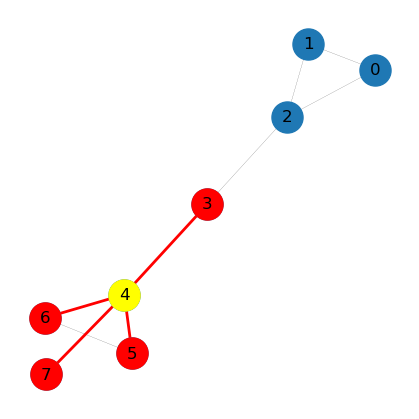

In [234]:
model=Model("degree_centrality")
y=model.addVars(G.nodes(), vtype=GRB.BINARY, obj=-1, name='y') ## star node
x=model.addVars(G.nodes(), vtype=GRB.BINARY, obj=-1, name='x') ## center node

storage = []
for i in G.nodes():
    storage.append(len([z for z in G.neighbors(i)]))

for i in G.nodes():
    if len(list(G.neighbors(i))) == max(storage):
        model.addConstr(x[i]*quicksum(y[z] for z in G.neighbors(i)) == max(storage))
        break
    
model.addConstr(quicksum(x[i] for i in G.nodes())==1)

model.addConstr(quicksum(y[j] for j in G.nodes())== max(storage))
    
model.optimize()
model.write('test.lp')


star_nodes = [i for i in G.nodes() if y[i].X==1]
center = [i for i in G.nodes() if x[i].X==1]
star_edges = [(i,j) for (i,j) in G.edges() if i in star_nodes and j in center] + [(j,i) for (j,i) in G.edges() if i in star_nodes and j in center]


nx.draw(G, pos, with_labels = True, node_size=500, width=0.1, alpha=1)
nx.draw_networkx_nodes(G, pos, nodelist=star_nodes, node_color='red', node_size=500)
nx.draw_networkx_nodes(G, pos, nodelist=center, node_color='yellow', node_size=500)
nx.draw_networkx_edges(G, pos, edgelist=star_edges, edge_color='red', width=2)

### For closeness centrality:

Gurobi Optimizer version 10.0.0 build v10.0.0rc2 (win64)

CPU model: 11th Gen Intel(R) Core(TM) i7-11800H @ 2.30GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 1 rows, 8 columns and 8 nonzeros
Model fingerprint: 0x508f2263
Variable types: 0 continuous, 8 integer (8 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [1e+01, 2e+01]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 1e+00]
Found heuristic solution: objective 19.0000000
Presolve removed 1 rows and 8 columns
Presolve time: 0.00s
Presolve: All rows and columns removed

Explored 0 nodes (0 simplex iterations) in 0.00 seconds (0.00 work units)
Thread count was 1 (of 16 available processors)

Solution count 2: 12 19 

Optimal solution found (tolerance 1.00e-04)
Best objective 1.200000000000e+01, best bound 1.200000000000e+01, gap 0.0000%


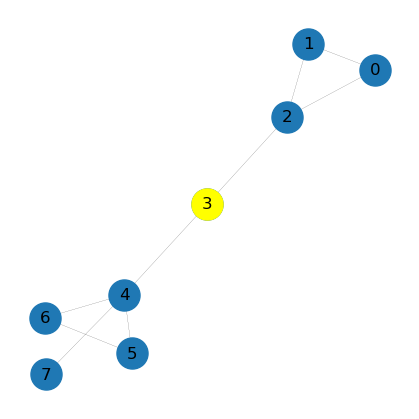

In [235]:
model=Model("closeness_centrality")

x=model.addVars(G.nodes(), vtype=GRB.BINARY,  name='x') ## center node

model.addConstr(quicksum(x[i] for i in G.nodes())==1)

shortest_path_length = {}
for i in G.nodes():
    for j in G.nodes():
        shortest_path_length[(i,j)] = nx.shortest_path_length(G, i, j)

obj = 0
for j in G.nodes():
    for i in G.nodes():
        obj += x[j]*shortest_path_length[(i,j)]
model.setObjective(obj, GRB.MINIMIZE)

model.optimize()
model.write('test.lp')

center = [i for i in G.nodes() if x[i].X==1]

nx.draw(G, pos, with_labels = True, node_size=500, width=0.1, alpha=1)
nx.draw_networkx_nodes(G, pos, nodelist=center, node_color='yellow', node_size=500)

### For betweenness centrality:

Gurobi Optimizer version 10.0.0 build v10.0.0rc2 (win64)

CPU model: 11th Gen Intel(R) Core(TM) i7-11800H @ 2.30GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 1 rows, 8 columns and 8 nonzeros
Model fingerprint: 0x756ffaa2
Variable types: 0 continuous, 8 integer (8 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [1e+01, 1e+01]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 1e+00]
Found heuristic solution: objective -0.0000000
Presolve removed 1 rows and 8 columns
Presolve time: 0.00s
Presolve: All rows and columns removed

Explored 0 nodes (0 simplex iterations) in 0.01 seconds (0.00 work units)
Thread count was 1 (of 16 available processors)

Solution count 2: 14 -0 

Optimal solution found (tolerance 1.00e-04)
Best objective 1.400000000000e+01, best bound 1.400000000000e+01, gap 0.0000%


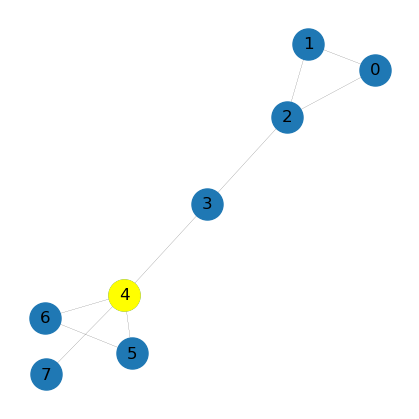

In [236]:
model=Model("betweenness_centrality")

x=model.addVars(G.nodes(), vtype=GRB.BINARY,  name='x') ## center node

model.addConstr(quicksum(x[i] for i in G.nodes())==1)

shortest_path = {}
for i in G.nodes():
    for j in G.nodes():
        if i != j:
            shortest_path[(i,j)] = nx.shortest_path(G, i, j)

count = {}
for i in G.nodes():
    count[i] = 0

for i in G.nodes():
    for (j,k) in shortest_path.keys():
        if j != i and k != i:
            if i in shortest_path[(j,k)]:
                count[i] += 1
    count[i] = int(count[i]/2)
    
obj = 0
for i in G.nodes():
    obj += x[i]*count[i]
model.setObjective(obj, GRB.MAXIMIZE)

model.optimize()
model.write('test.lp')


center = [i for i in G.nodes() if x[i].X==1]

nx.draw(G, pos, with_labels = True, node_size=500, width=0.1, alpha=1)
nx.draw_networkx_nodes(G, pos, nodelist=center, node_color='yellow', node_size=500)

# Question 1_c<a name = "Question1c"></a>

### degree centrality for les_miserables_graph:

Gurobi Optimizer version 10.0.0 build v10.0.0rc2 (win64)

CPU model: 11th Gen Intel(R) Core(TM) i7-11800H @ 2.30GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 2 rows, 154 columns and 154 nonzeros
Model fingerprint: 0xf8dcd259
Model has 1 quadratic constraint
Variable types: 0 continuous, 154 integer (154 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  QMatrix range    [1e+00, 1e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 4e+01]
  QRHS range       [4e+01, 4e+01]
Presolve removed 2 rows and 154 columns
Presolve time: 0.00s
Presolve: All rows and columns removed

Explored 0 nodes (0 simplex iterations) in 0.01 seconds (0.00 work units)
Thread count was 1 (of 16 available processors)

Solution count 1: -37 
No other solutions better than -37

Optimal solution found (tolerance 1.00e-04)
Best objective -3.700000000000e+0

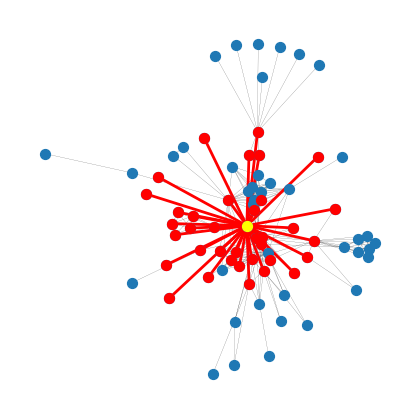

In [249]:
G = nx.les_miserables_graph()
pos = nx.spring_layout(G)

model=Model("degree_centrality_les_miserables_graph")
y=model.addVars(G.nodes(), vtype=GRB.BINARY, obj=-1, name='y') ## star node
x=model.addVars(G.nodes(), vtype=GRB.BINARY, obj=-1, name='x') ## center node

storage = []
for i in G.nodes():
    storage.append(len([z for z in G.neighbors(i)]))

for i in G.nodes():
    if len(list(G.neighbors(i))) == max(storage):
        model.addConstr(x[i]*quicksum(y[z] for z in G.neighbors(i)) == max(storage))
        break
    
model.addConstr(quicksum(x[i] for i in G.nodes())==1)

model.addConstr(quicksum(y[j] for j in G.nodes())== max(storage))
    
model.optimize()
model.write('test.lp')


star_nodes = [i for i in G.nodes() if y[i].X==1]
center = [i for i in G.nodes() if x[i].X==1]
star_edges = [(i,j) for (i,j) in G.edges() if i in star_nodes and j in center] + [(j,i) for (j,i) in G.edges() if i in star_nodes and j in center]


nx.draw(G, pos,  node_size=50, width=0.1, alpha=1)
nx.draw_networkx_nodes(G, pos, nodelist=star_nodes, node_color='red', node_size=50)
nx.draw_networkx_nodes(G, pos, nodelist=center, node_color='yellow', node_size=50)
nx.draw_networkx_edges(G, pos, edgelist=star_edges, edge_color='red', width=2)

If I further check with the build-in degree centrality function, the guribi ends up with the same result.

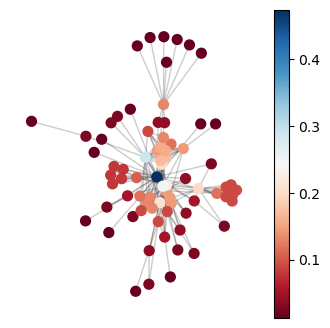

In [250]:
deg=nx.degree_centrality(G)
colors_deg = [deg[i] for i in G.nodes()]

ec = nx.draw_networkx_edges(G, pos, alpha=0.2)
nc = nx.draw_networkx_nodes(G, pos, nodelist=G.nodes(), node_color=colors_deg, 
                            node_size=50, cmap=plt.cm.RdBu) 

plt.colorbar(nc)
plt.axis('off')
plt.show()

### closeness centrality for les_miserables_graph:

Gurobi Optimizer version 10.0.0 build v10.0.0rc2 (win64)

CPU model: 11th Gen Intel(R) Core(TM) i7-11800H @ 2.30GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 1 rows, 77 columns and 77 nonzeros
Model fingerprint: 0xd8b02d97
Variable types: 0 continuous, 77 integer (77 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [1e+02, 3e+02]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 1e+00]
Found heuristic solution: objective 252.0000000
Presolve removed 1 rows and 77 columns
Presolve time: 0.00s
Presolve: All rows and columns removed

Explored 0 nodes (0 simplex iterations) in 0.00 seconds (0.00 work units)
Thread count was 1 (of 16 available processors)

Solution count 2: 118 252 

Optimal solution found (tolerance 1.00e-04)
Best objective 1.180000000000e+02, best bound 1.180000000000e+02, gap 0.0000%


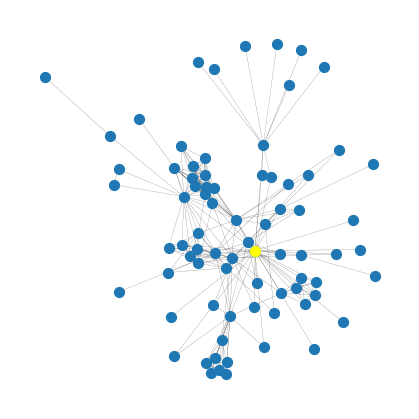

In [252]:
G = nx.les_miserables_graph()
pos = nx.spring_layout(G)

model=Model("closeness_centrality_les_miserables_graph")

x=model.addVars(G.nodes(), vtype=GRB.BINARY,  name='x') ## center node

model.addConstr(quicksum(x[i] for i in G.nodes())==1)

shortest_path_length = {}
for i in G.nodes():
    for j in G.nodes():
        shortest_path_length[(i,j)] = nx.shortest_path_length(G, i, j)

obj = 0
for j in G.nodes():
    for i in G.nodes():
        obj += x[j]*shortest_path_length[(i,j)]
model.setObjective(obj, GRB.MINIMIZE)

model.optimize()
model.write('test.lp')

center = [i for i in G.nodes() if x[i].X==1]

nx.draw(G, pos, node_size=50, width=0.1, alpha=1)
nx.draw_networkx_nodes(G, pos, nodelist=center, node_color='yellow', node_size=50)

If I further check with the build-in closeness centrality function, the guribi ends up with the same result.

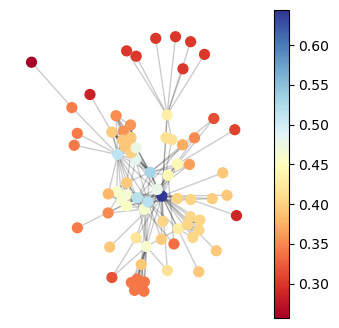

In [256]:
close=nx.closeness_centrality(G)
colors_close = [close[i] for i in G.nodes()]

ec = nx.draw_networkx_edges(G, pos, alpha=0.2)
nc = nx.draw_networkx_nodes(G, pos, nodelist=G.nodes(), node_color=colors_close, 
                            node_size=50, cmap=plt.cm.RdYlBu) 

plt.colorbar(nc)
plt.axis('off')
plt.show()

### betweenness centrality for les_miserables_graph:

Gurobi Optimizer version 10.0.0 build v10.0.0rc2 (win64)

CPU model: 11th Gen Intel(R) Core(TM) i7-11800H @ 2.30GHz, instruction set [SSE2|AVX|AVX2|AVX512]
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads

Optimize a model with 1 rows, 77 columns and 77 nonzeros
Model fingerprint: 0x92cdc18a
Variable types: 0 continuous, 77 integer (77 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [2e+00, 2e+03]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 1e+00]
Found heuristic solution: objective -0.0000000
Presolve removed 1 rows and 77 columns
Presolve time: 0.00s
Presolve: All rows and columns removed

Explored 0 nodes (0 simplex iterations) in 0.01 seconds (0.00 work units)
Thread count was 1 (of 16 available processors)

Solution count 2: 1721 -0 

Optimal solution found (tolerance 1.00e-04)
Best objective 1.721000000000e+03, best bound 1.721000000000e+03, gap 0.0000%


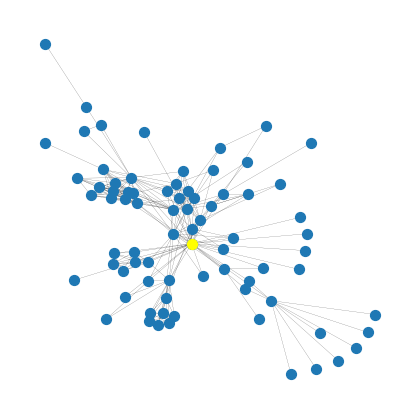

In [257]:
G = nx.les_miserables_graph()
pos = nx.spring_layout(G)

model=Model("betweenness_centrality_les_miserables_graph")

x=model.addVars(G.nodes(), vtype=GRB.BINARY,  name='x') ## center node

model.addConstr(quicksum(x[i] for i in G.nodes())==1)

shortest_path = {}
for i in G.nodes():
    for j in G.nodes():
        if i != j:
            shortest_path[(i,j)] = nx.shortest_path(G, i, j)

count = {}
for i in G.nodes():
    count[i] = 0

for i in G.nodes():
    for (j,k) in shortest_path.keys():
        if j != i and k != i:
            if i in shortest_path[(j,k)]:
                count[i] += 1
    count[i] = int(count[i]/2)
    
obj = 0
for i in G.nodes():
    obj += x[i]*count[i]
model.setObjective(obj, GRB.MAXIMIZE)

model.optimize()
model.write('test.lp')


center = [i for i in G.nodes() if x[i].X==1]

nx.draw(G, pos, node_size=50, width=0.1, alpha=1)
nx.draw_networkx_nodes(G, pos, nodelist=center, node_color='yellow', node_size=50)

If I further check with the build-in betweenness centrality function, the guribi ends up with the same result.

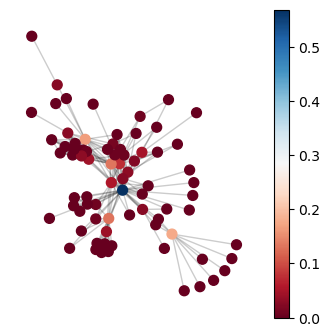

In [258]:
bet=nx.betweenness_centrality(G)
colors_bet = [bet[i] for i in G.nodes()]

ec = nx.draw_networkx_edges(G, pos, alpha=0.2)
nc = nx.draw_networkx_nodes(G, pos, nodelist=G.nodes(), node_color=colors_bet, 
                            node_size=50, cmap=plt.cm.RdBu) 

plt.colorbar(nc)
plt.axis('off')
plt.show()

# Question 2_a<a name = "Question2a"></a>

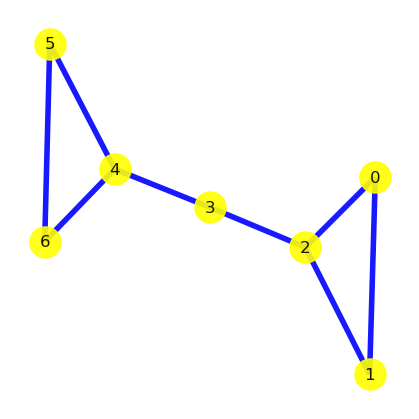

In [259]:
G = nx.Graph()
node_tuple = [(0,1), (0,2), (1,2), (2,3), (3,4), (4,5), (5,6), (4,6)]
G.add_edges_from(node_tuple)
pos=nx.spring_layout(G)
nx.draw(G,pos, with_labels=True, node_size=500,  node_color='yellow', alpha = 0.9, edge_color = "blue", width = 4)

In [260]:
communities=[]
for i in G.nodes():
    communities.append([i])
    
# Printing the initial modularity:
import networkx.algorithms.community as nx_comm
print("initial modularity value:", nx_comm.modularity(G, communities))

initial modularity value: -0.1484375


The modularity clustering formula is:
$$Q = \sum_{c}\lfloor\frac{|E_{c}|}{|E|} -  (\frac{d_{c}}{2|E|})^2\rfloor$$

where 
$$E_{c} =  \text{the number of edges in the community} $$
$$E =  \text{the number of edges in the graph} $$
$$d_{c} = \sum_{i \in c} d_{i}$$


1. if we want to minimize the Q, we should minimize $\frac{|E_{c}|}{|E|} $ be 0 (since $|E| \geq 0$, $|E_{c}| \geq 0$  , the minimium of $\frac{|E_{c}|}{|E|}$ can be if and only if 0) $\Rightarrow$ there have $|V|$ nodes (each node will be a unique cluster).
2. $(\frac{d_{c}}{2|E|})^2 \geq 0 \Rightarrow$ $min Q$ = $-(\frac{d_{c}}{2|E|})^2 \Rightarrow max (\frac{d_{c}}{2|E|})^2$, the largest of $(\frac{d_{c}}{|E|})^2$ will be $|E|$ = 1, $d_{c} = 1$, and $|V|$ = 1, $\sum(\frac{d_{c}}{|E|})^2$ = $(\frac{1}{2*1})^2 = \frac{1}{2} = 0.5$ $\Rightarrow$ the $min Q$ = -0.5

# Question 2_b<a name = "Question2b"></a>

##### Erdos-Renyi graphs with n = 100 and p = 0.1

-0.040364583333333336


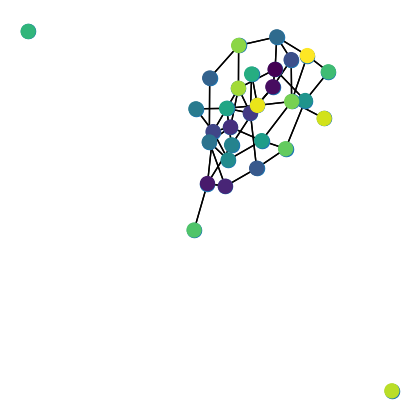

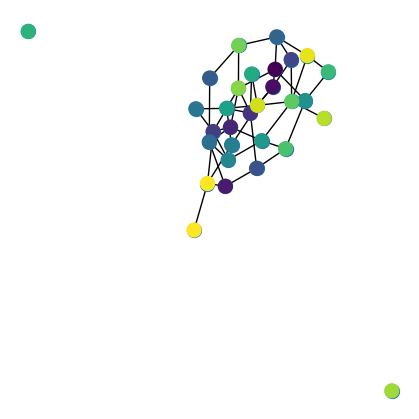

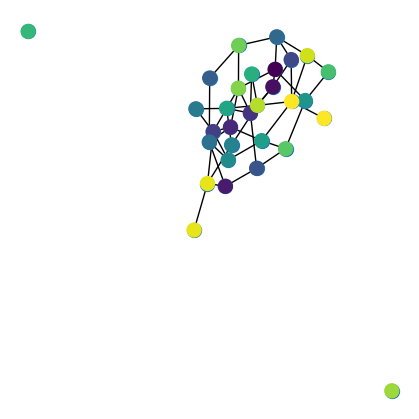

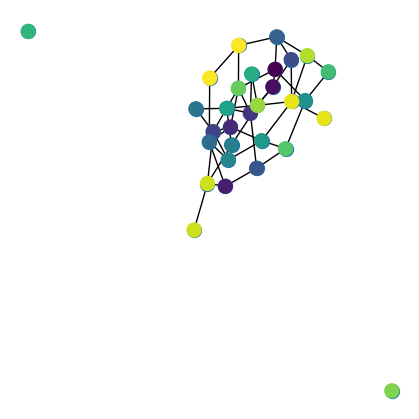

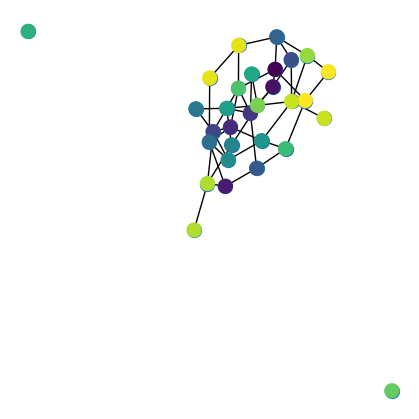

...

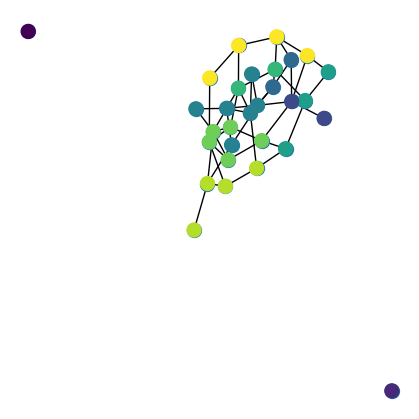

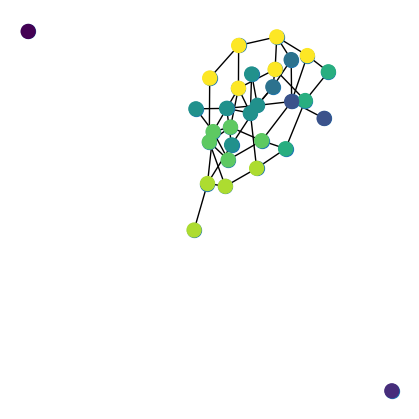

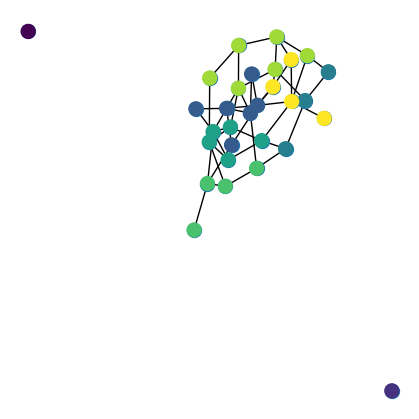

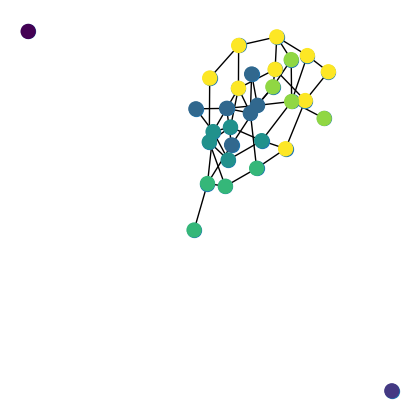

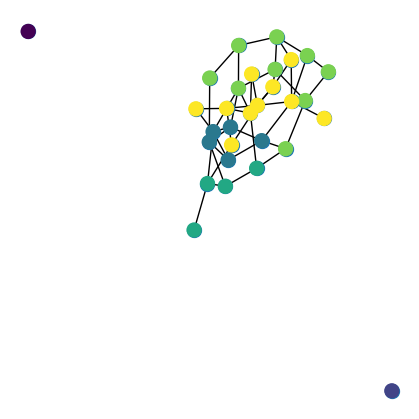

Number of communities: 6
Communities: [[19], [26], [14, 16, 6, 4, 11], [2, 21, 3, 8], [22, 15, 20, 0, 25, 9, 24, 10, 29], [5, 18, 12, 17, 13, 28, 23, 27, 1, 7]]
Modularity: 0.4051649305555556


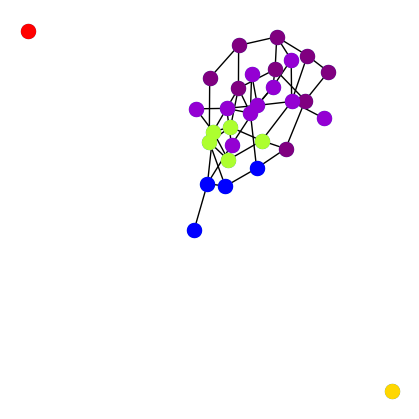

In [261]:
n=30
p=0.1
G=nx.erdos_renyi_graph(n,p)
pos=nx.spring_layout(G)
nx.draw(G, pos, node_size=100)

# Every node is its own community initially.
communities=[]
for i in G.nodes():
    communities.append([i])
    
# Printing the initial modularity:
import networkx.algorithms.community as nx_comm
print(nx_comm.modularity(G, communities))


import networkx.algorithms.community as nx_comm
import matplotlib.pyplot as plt

iteration=0
maxModularity=20
prevModularity=nx_comm.modularity(G, communities)
while maxModularity>0:
    nx.draw(G, pos, node_size=100)
    colors=[]
    for i in G.nodes():
        for j in range(len(communities)):
            if i in communities[j]:
                colors.append(j)
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=G.nodes(), node_color=colors, node_size=100)
    #plt.savefig("./images/les_mis"+str(iteration)+".png", dpi=300)
    plt.show()
    iteration+=1
    maxModularity=-1
    saveI=-1
    saveJ=-1
    for (i,j) in combinations(communities,2):
        communities2=[]
        for k in communities:
            if k!=i and k!=j:
                communities2.append(k)
        communities2.append(i+j)
        if nx_comm.modularity(G,communities2)-prevModularity>maxModularity:
            maxModularity=nx_comm.modularity(G,communities2)-prevModularity
            saveI=i
            saveJ=j
    if maxModularity>0:
        communities2=[]
        for k in communities:
            communities2.append(k)
        communities=[]
        for k in communities2:
            if k!=saveI and k!=saveJ:
                communities.append(k)
        communities.append(saveI+saveJ)
    prevModularity=nx_comm.modularity(G,communities)
    
print("Number of communities:", len(communities))
print("Communities:", communities)
print("Modularity:", nx_comm.modularity(G,communities))
colors = ["red", "gold", "greenyellow", "blue", "purple", "darkviolet", "deeppink", "crimson", "black", "turquoise"]

nx.draw(G, pos, node_size=100)
comm=0
for c in communities:
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=c, node_color=colors[comm], node_size=100)
    comm+=1

Number of communities: 6
Communities: [[19], [26], [14, 16, 6, 4, 11], [2, 21, 3, 8], [22, 15, 20, 0, 25, 9, 24, 10, 29], [5, 18, 12, 17, 13, 28, 23, 27, 1, 7]]
Modularity: 0.4051649305555556


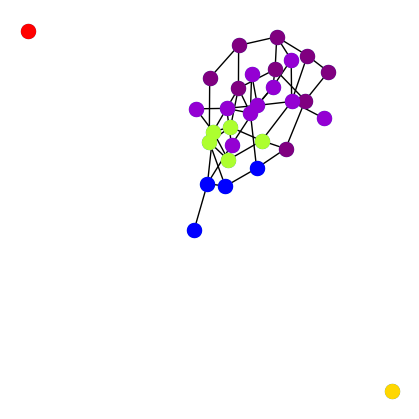

In [262]:
print("Number of communities:", len(communities))
print("Communities:", communities)
print("Modularity:", nx_comm.modularity(G,communities))
colors = ["red", "gold", "greenyellow", "blue", "purple", "darkviolet", "deeppink", "crimson", "black", "turquoise"]

nx.draw(G, pos, node_size=100)
comm=0
for c in communities:
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=c, node_color=colors[comm], node_size=100)
    comm+=1

In [263]:
print(nx_comm.modularity(G, communities))

0.4051649305555556


##### Erdos-Renyi graphs with n = 100 and p = 0.5

-0.034048497737745265


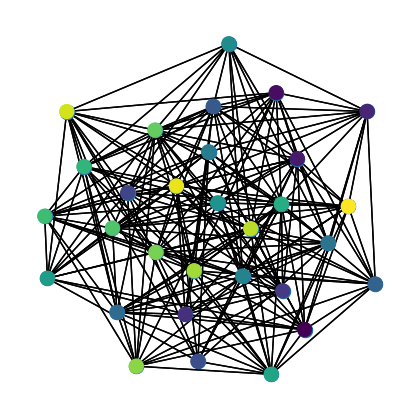

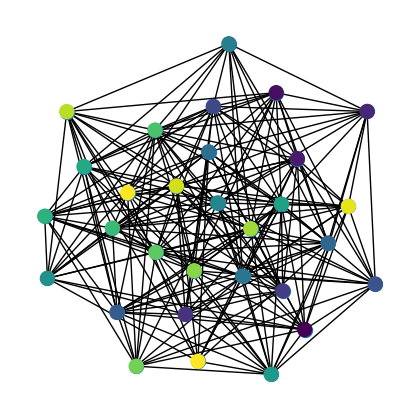

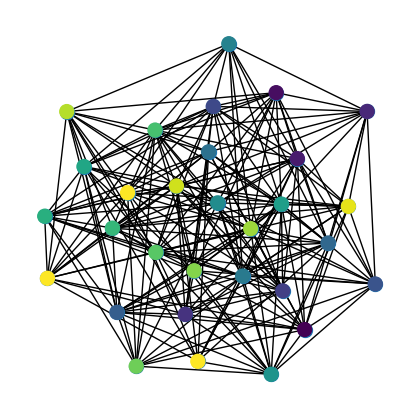

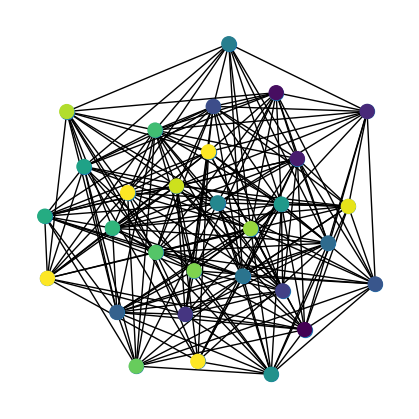

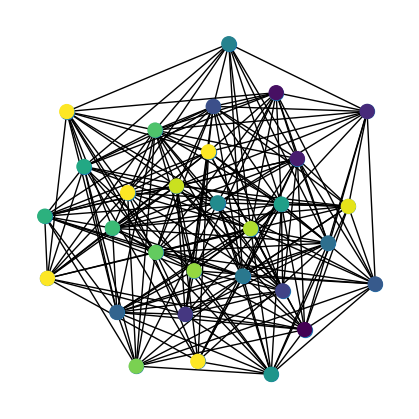

...

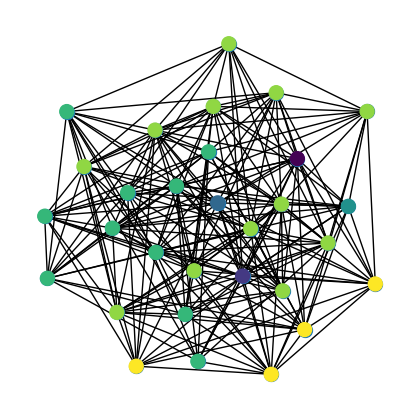

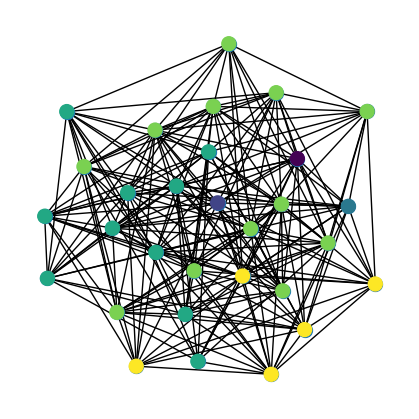

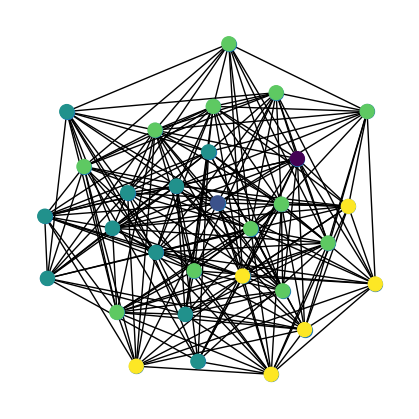

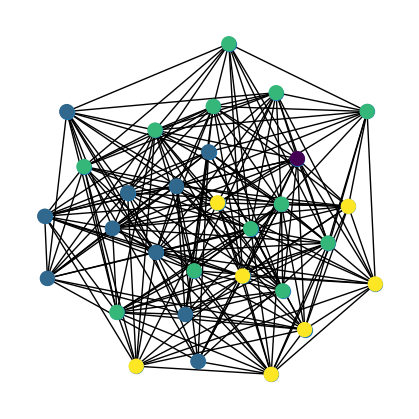

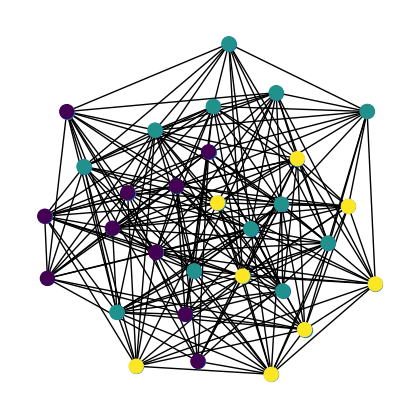

Number of communities: 3
Communities: [[23, 21, 20, 4, 28, 27, 12, 16, 6, 7], [5, 10, 26, 25, 19, 22, 8, 1, 18, 11, 3, 14], [2, 15, 29, 13, 17, 0, 9, 24]]
Modularity: 0.12212005587873477


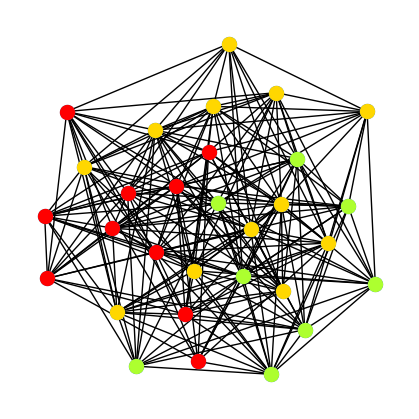

In [264]:
n=30
p=0.5
G=nx.erdos_renyi_graph(n,p)
pos=nx.spring_layout(G)
nx.draw(G, pos, node_size=100)

# Every node is its own community initially.
communities=[]
for i in G.nodes():
    communities.append([i])
    
# Printing the initial modularity:
import networkx.algorithms.community as nx_comm
print(nx_comm.modularity(G, communities))


import networkx.algorithms.community as nx_comm
import matplotlib.pyplot as plt

iteration=0
maxModularity=20
prevModularity=nx_comm.modularity(G, communities)
while maxModularity>0:
    nx.draw(G, pos, node_size=100)
    colors=[]
    for i in G.nodes():
        for j in range(len(communities)):
            if i in communities[j]:
                colors.append(j)
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=G.nodes(), node_color=colors, node_size=100)
    #plt.savefig("./images/les_mis"+str(iteration)+".png", dpi=300)
    plt.show()
    iteration+=1
    maxModularity=-1
    saveI=-1
    saveJ=-1
    for (i,j) in combinations(communities,2):
        communities2=[]
        for k in communities:
            if k!=i and k!=j:
                communities2.append(k)
        communities2.append(i+j)
        if nx_comm.modularity(G,communities2)-prevModularity>maxModularity:
            maxModularity=nx_comm.modularity(G,communities2)-prevModularity
            saveI=i
            saveJ=j
    if maxModularity>0:
        communities2=[]
        for k in communities:
            communities2.append(k)
        communities=[]
        for k in communities2:
            if k!=saveI and k!=saveJ:
                communities.append(k)
        communities.append(saveI+saveJ)
    prevModularity=nx_comm.modularity(G,communities)
    
print("Number of communities:", len(communities))
print("Communities:", communities)
print("Modularity:", nx_comm.modularity(G,communities))
colors = ["red", "gold", "greenyellow", "blue", "purple", "darkviolet", "deeppink", "crimson", "black", "turquoise"]

nx.draw(G, pos, node_size=100)
comm=0
for c in communities:
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=c, node_color=colors[comm], node_size=100)
    comm+=1

Number of communities: 3
Communities: [[23, 21, 20, 4, 28, 27, 12, 16, 6, 7], [5, 10, 26, 25, 19, 22, 8, 1, 18, 11, 3, 14], [2, 15, 29, 13, 17, 0, 9, 24]]
Modularity: 0.12212005587873477


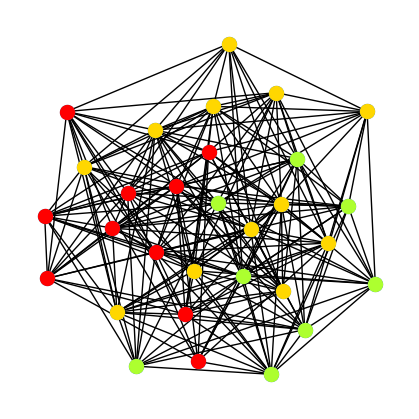

In [265]:
print("Number of communities:", len(communities))
print("Communities:", communities)
print("Modularity:", nx_comm.modularity(G,communities))
colors = ["red", "gold", "greenyellow", "blue", "purple", "darkviolet", "deeppink", "crimson", "black", "turquoise"]

nx.draw(G, pos, node_size=100)
comm=0
for c in communities:
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=c, node_color=colors[comm], node_size=100)
    comm+=1

In [266]:
print(nx_comm.modularity(G, communities))

0.12212005587873477


##### Erdos-Renyi graphs with n = 100 and p = 0.9

-0.033556990265008114


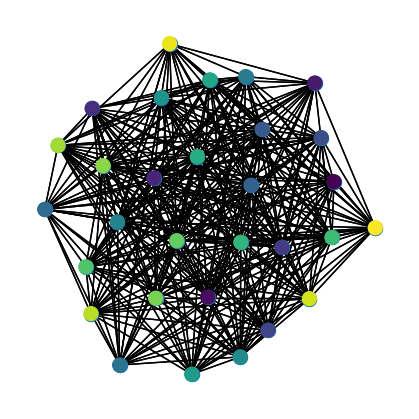

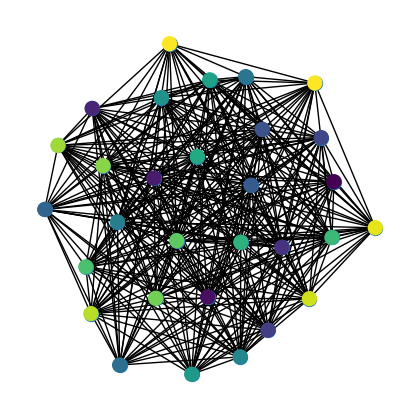

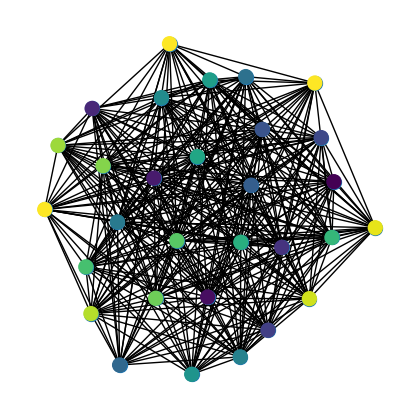

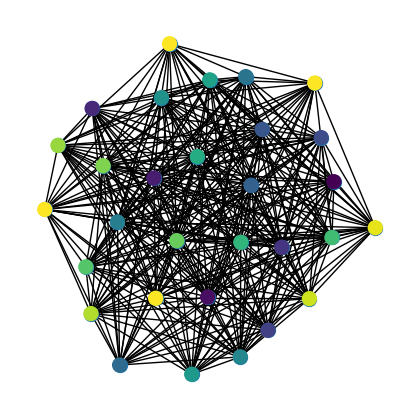

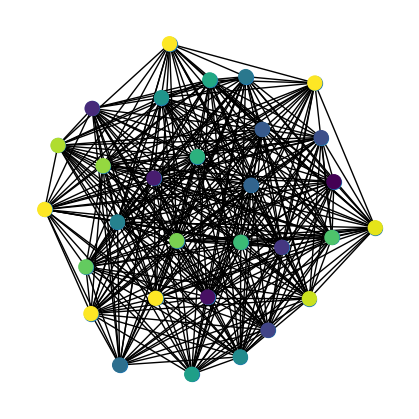

...

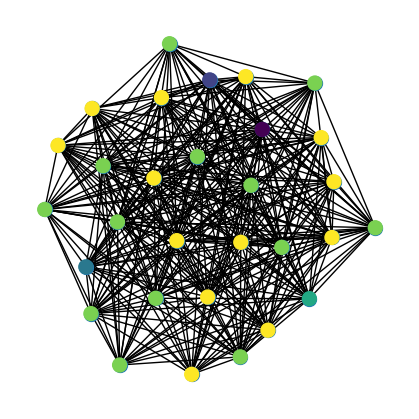

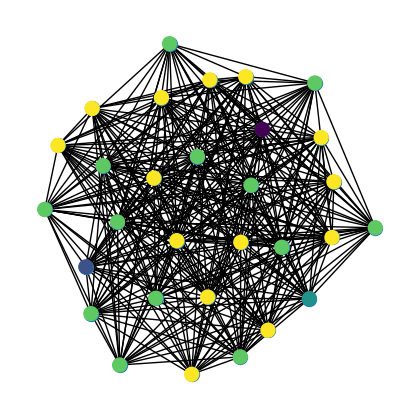

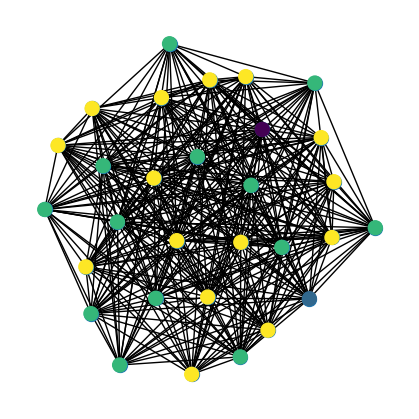

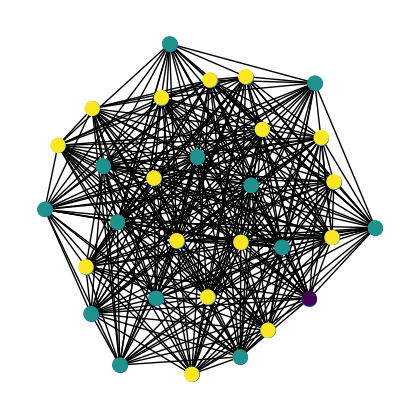

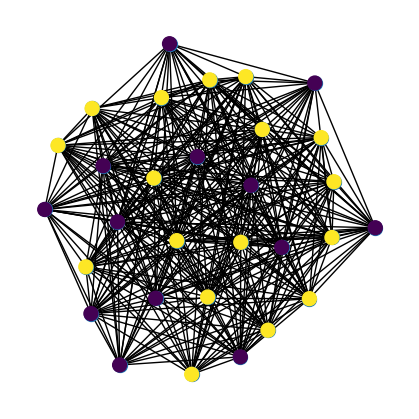

Number of communities: 2
Communities: [[14, 29, 5, 11, 13, 18, 9, 24, 26, 23, 10, 2, 28], [27, 8, 21, 17, 12, 7, 20, 19, 15, 0, 22, 3, 1, 25, 16, 4, 6]]
Modularity: 0.045898965657111934


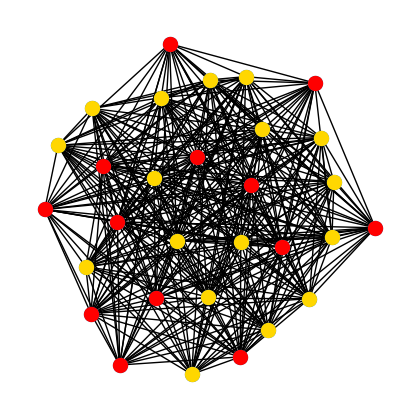

In [267]:
n=30
p=0.8
G=nx.erdos_renyi_graph(n,p)
pos=nx.spring_layout(G)
nx.draw(G, pos, node_size=100)

# Every node is its own community initially.
communities=[]
for i in G.nodes():
    communities.append([i])
    
# Printing the initial modularity:
import networkx.algorithms.community as nx_comm
print(nx_comm.modularity(G, communities))


import networkx.algorithms.community as nx_comm
import matplotlib.pyplot as plt

iteration=0
maxModularity=20
prevModularity=nx_comm.modularity(G, communities)
while maxModularity>0:
    nx.draw(G, pos, node_size=100)
    colors=[]
    for i in G.nodes():
        for j in range(len(communities)):
            if i in communities[j]:
                colors.append(j)
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=G.nodes(), node_color=colors, node_size=100)
    #plt.savefig("./images/les_mis"+str(iteration)+".png", dpi=300)
    plt.show()
    iteration+=1
    maxModularity=-1
    saveI=-1
    saveJ=-1
    for (i,j) in combinations(communities,2):
        communities2=[]
        for k in communities:
            if k!=i and k!=j:
                communities2.append(k)
        communities2.append(i+j)
        if nx_comm.modularity(G,communities2)-prevModularity>maxModularity:
            maxModularity=nx_comm.modularity(G,communities2)-prevModularity
            saveI=i
            saveJ=j
    if maxModularity>0:
        communities2=[]
        for k in communities:
            communities2.append(k)
        communities=[]
        for k in communities2:
            if k!=saveI and k!=saveJ:
                communities.append(k)
        communities.append(saveI+saveJ)
    prevModularity=nx_comm.modularity(G,communities)
    
print("Number of communities:", len(communities))
print("Communities:", communities)
print("Modularity:", nx_comm.modularity(G,communities))
colors = ["red", "gold", "greenyellow", "blue", "purple", "darkviolet", "deeppink", "crimson", "black", "turquoise"]

nx.draw(G, pos, node_size=100)
comm=0
for c in communities:
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=c, node_color=colors[comm], node_size=100)
    comm+=1

Number of communities: 2
Communities: [[14, 29, 5, 11, 13, 18, 9, 24, 26, 23, 10, 2, 28], [27, 8, 21, 17, 12, 7, 20, 19, 15, 0, 22, 3, 1, 25, 16, 4, 6]]
Modularity: 0.045898965657111934


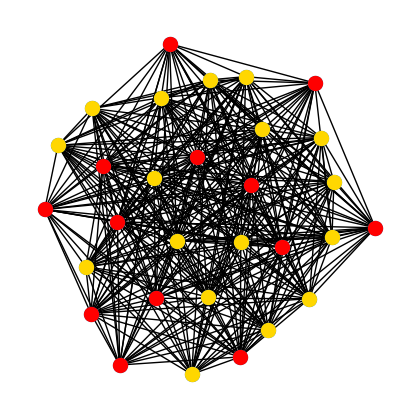

In [268]:
print("Number of communities:", len(communities))
print("Communities:", communities)
print("Modularity:", nx_comm.modularity(G,communities))
colors = ["red", "gold", "greenyellow", "blue", "purple", "darkviolet", "deeppink", "crimson", "black", "turquoise"]

nx.draw(G, pos, node_size=100)
comm=0
for c in communities:
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=c, node_color=colors[comm], node_size=100)
    comm+=1

In [269]:
print(nx_comm.modularity(G, communities))

0.045898965657111934


##### Barabasi-Albert with n = 100 and k = 1

-0.08204518430439942


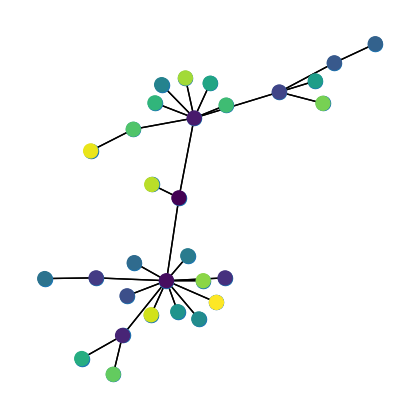

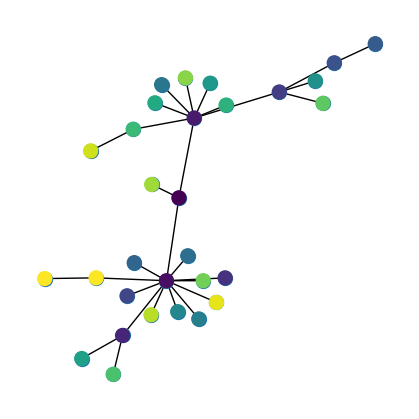

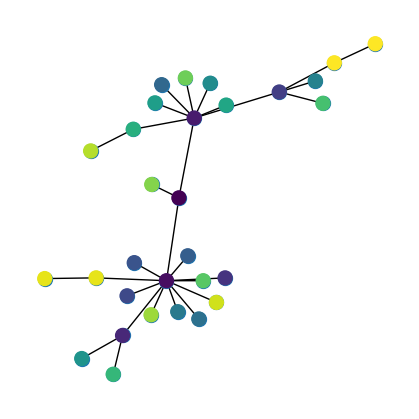

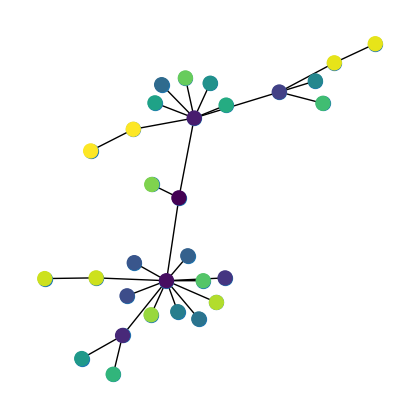

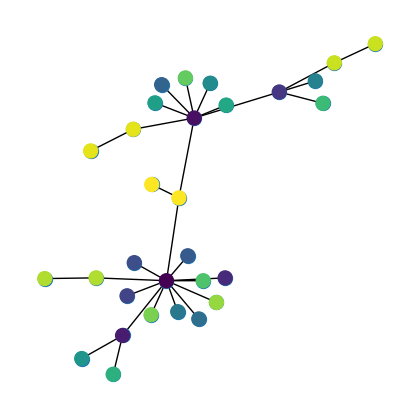

...

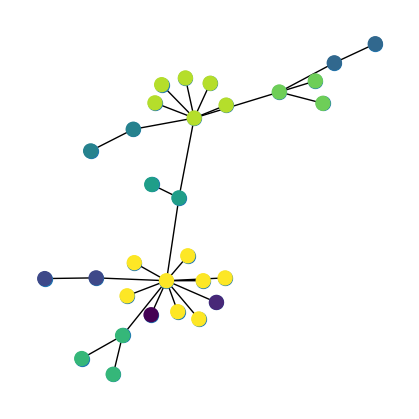

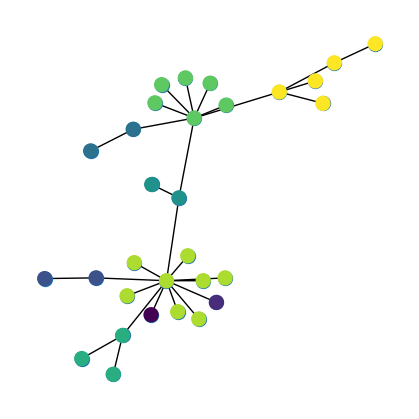

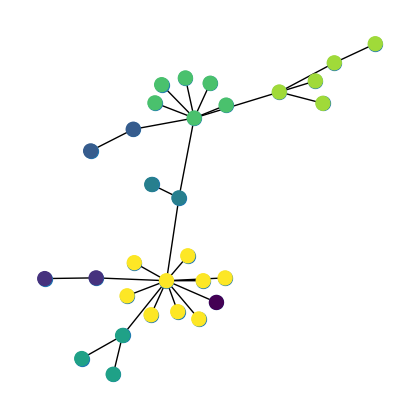

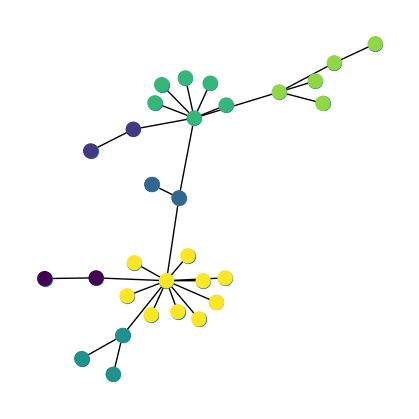

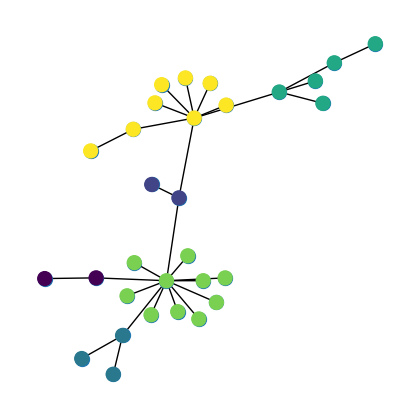

Number of communities: 6
Communities: [[5, 11], [0, 26], [22, 3, 18], [8, 9, 23, 6, 16], [29, 27, 24, 15, 14, 12, 10, 7, 1, 4], [21, 28, 25, 20, 19, 17, 2, 13]]
Modularity: 0.5814506539833532


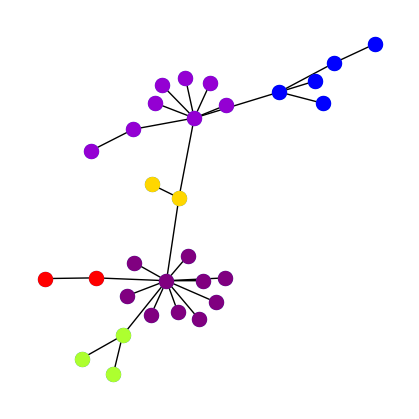

In [270]:
n=30
k=1
G=G=nx.barabasi_albert_graph(n,k)
pos=nx.spring_layout(G)
nx.draw(G, pos, node_size=100)

# Every node is its own community initially.
communities=[]
for i in G.nodes():
    communities.append([i])
    
# Printing the initial modularity:
import networkx.algorithms.community as nx_comm
print(nx_comm.modularity(G, communities))


import networkx.algorithms.community as nx_comm
import matplotlib.pyplot as plt

iteration=0
maxModularity=20
prevModularity=nx_comm.modularity(G, communities)
while maxModularity>0:
    nx.draw(G, pos, node_size=100)
    colors=[]
    for i in G.nodes():
        for j in range(len(communities)):
            if i in communities[j]:
                colors.append(j)
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=G.nodes(), node_color=colors, node_size=100)
    #plt.savefig("./images/les_mis"+str(iteration)+".png", dpi=300)
    plt.show()
    iteration+=1
    maxModularity=-1
    saveI=-1
    saveJ=-1
    for (i,j) in combinations(communities,2):
        communities2=[]
        for k in communities:
            if k!=i and k!=j:
                communities2.append(k)
        communities2.append(i+j)
        if nx_comm.modularity(G,communities2)-prevModularity>maxModularity:
            maxModularity=nx_comm.modularity(G,communities2)-prevModularity
            saveI=i
            saveJ=j
    if maxModularity>0:
        communities2=[]
        for k in communities:
            communities2.append(k)
        communities=[]
        for k in communities2:
            if k!=saveI and k!=saveJ:
                communities.append(k)
        communities.append(saveI+saveJ)
    prevModularity=nx_comm.modularity(G,communities)
    
print("Number of communities:", len(communities))
print("Communities:", communities)
print("Modularity:", nx_comm.modularity(G,communities))
colors = ["red", "gold", "greenyellow", "blue", "purple", "darkviolet", "deeppink", "crimson", "black", "turquoise"]

nx.draw(G, pos, node_size=100)
comm=0
for c in communities:
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=c, node_color=colors[comm], node_size=100)
    comm+=1

Number of communities: 6
Communities: [[5, 11], [0, 26], [22, 3, 18], [8, 9, 23, 6, 16], [29, 27, 24, 15, 14, 12, 10, 7, 1, 4], [21, 28, 25, 20, 19, 17, 2, 13]]
Modularity: 0.5814506539833532


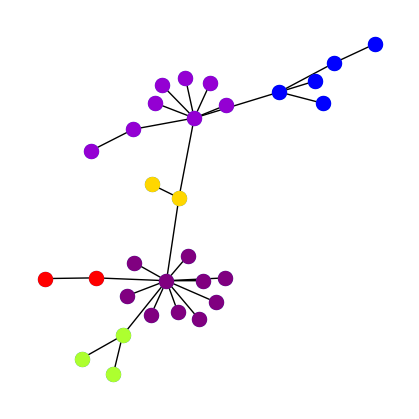

In [271]:
print("Number of communities:", len(communities))
print("Communities:", communities)
print("Modularity:", nx_comm.modularity(G,communities))
colors = ["red", "gold", "greenyellow", "blue", "purple", "darkviolet", "deeppink", "crimson", "black", "turquoise"]

nx.draw(G, pos, node_size=100)
comm=0
for c in communities:
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=c, node_color=colors[comm], node_size=100)
    comm+=1

In [272]:
print(nx_comm.modularity(G, communities))

0.5814506539833532


##### Barabasi-Albert with n = 100 and k = 2

-0.051498724489795894


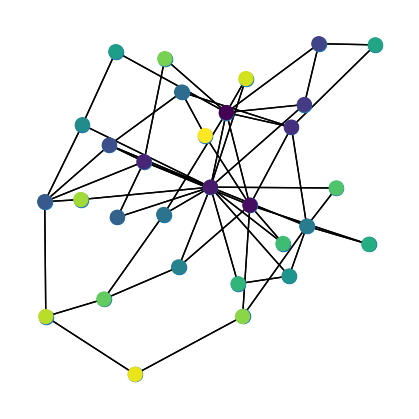

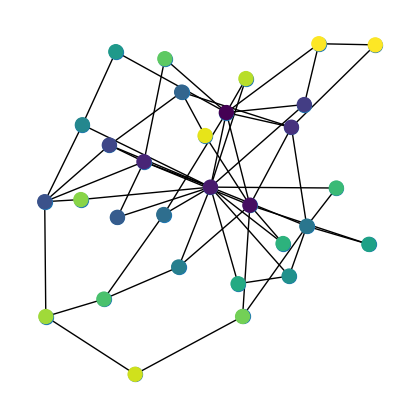

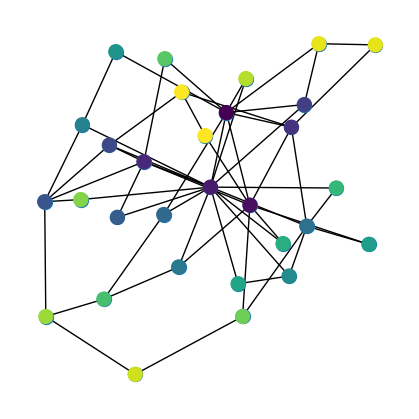

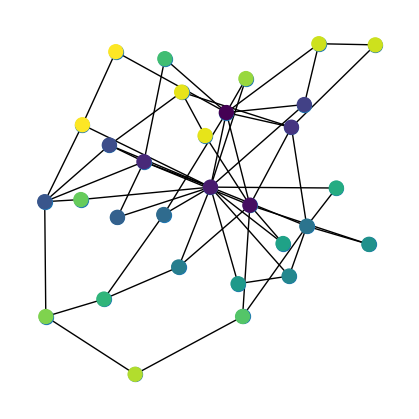

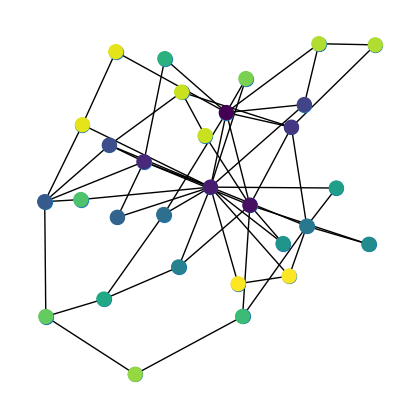

...

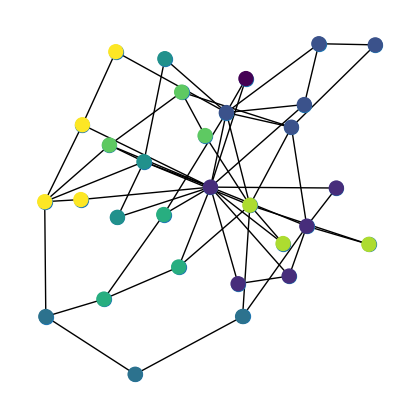

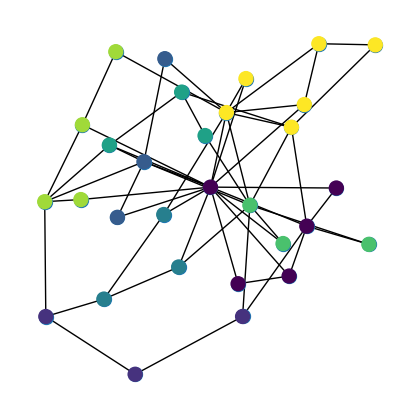

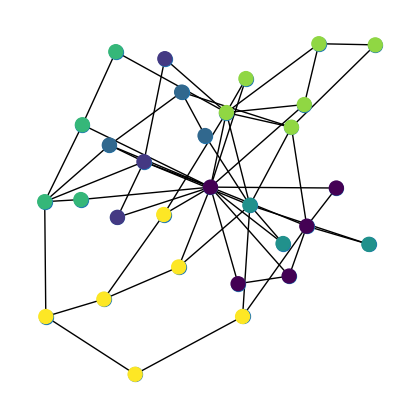

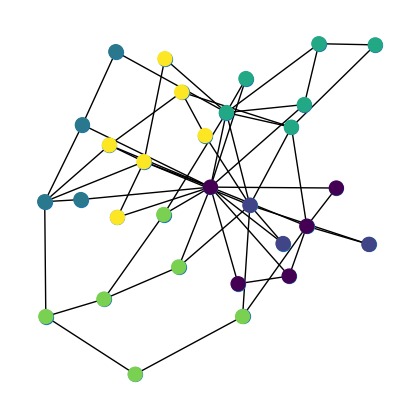

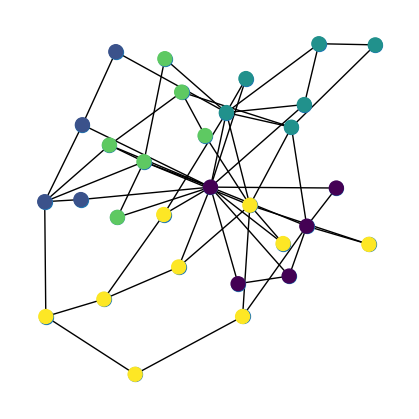

Number of communities: 5
Communities: [[21, 12, 2, 15, 19], [14, 16, 8, 25], [27, 4, 0, 5, 6, 17], [23, 3, 9, 7, 10, 29], [20, 1, 18, 26, 24, 28, 13, 11, 22]]
Modularity: 0.33785076530612246


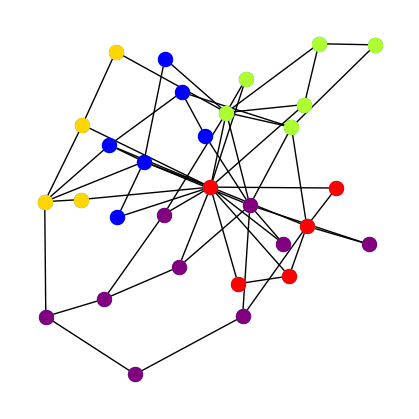

In [273]:
n=30
k=2
G=G=nx.barabasi_albert_graph(n,k)
pos=nx.spring_layout(G)
nx.draw(G, pos, node_size=100)

# Every node is its own community initially.
communities=[]
for i in G.nodes():
    communities.append([i])
    
# Printing the initial modularity:
import networkx.algorithms.community as nx_comm
print(nx_comm.modularity(G, communities))


import networkx.algorithms.community as nx_comm
import matplotlib.pyplot as plt

iteration=0
maxModularity=20
prevModularity=nx_comm.modularity(G, communities)
while maxModularity>0:
    nx.draw(G, pos, node_size=100)
    colors=[]
    for i in G.nodes():
        for j in range(len(communities)):
            if i in communities[j]:
                colors.append(j)
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=G.nodes(), node_color=colors, node_size=100)
    #plt.savefig("./images/les_mis"+str(iteration)+".png", dpi=300)
    plt.show()
    iteration+=1
    maxModularity=-1
    saveI=-1
    saveJ=-1
    for (i,j) in combinations(communities,2):
        communities2=[]
        for k in communities:
            if k!=i and k!=j:
                communities2.append(k)
        communities2.append(i+j)
        if nx_comm.modularity(G,communities2)-prevModularity>maxModularity:
            maxModularity=nx_comm.modularity(G,communities2)-prevModularity
            saveI=i
            saveJ=j
    if maxModularity>0:
        communities2=[]
        for k in communities:
            communities2.append(k)
        communities=[]
        for k in communities2:
            if k!=saveI and k!=saveJ:
                communities.append(k)
        communities.append(saveI+saveJ)
    prevModularity=nx_comm.modularity(G,communities)
    
print("Number of communities:", len(communities))
print("Communities:", communities)
print("Modularity:", nx_comm.modularity(G,communities))
colors = ["red", "gold", "greenyellow", "blue", "purple", "darkviolet", "deeppink", "crimson", "black", "turquoise"]

nx.draw(G, pos, node_size=100)
comm=0
for c in communities:
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=c, node_color=colors[comm], node_size=100)
    comm+=1

Number of communities: 5
Communities: [[21, 12, 2, 15, 19], [14, 16, 8, 25], [27, 4, 0, 5, 6, 17], [23, 3, 9, 7, 10, 29], [20, 1, 18, 26, 24, 28, 13, 11, 22]]
Modularity: 0.33785076530612246


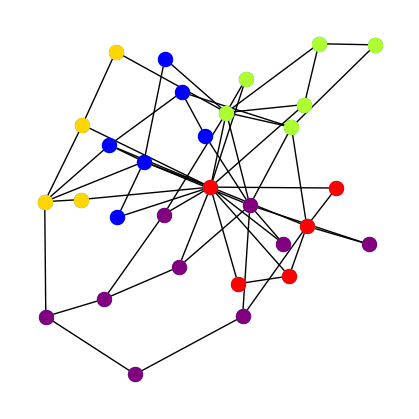

In [274]:
print("Number of communities:", len(communities))
print("Communities:", communities)
print("Modularity:", nx_comm.modularity(G,communities))
colors = ["red", "gold", "greenyellow", "blue", "purple", "darkviolet", "deeppink", "crimson", "black", "turquoise"]

nx.draw(G, pos, node_size=100)
comm=0
for c in communities:
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=c, node_color=colors[comm], node_size=100)
    comm+=1

In [275]:
print(nx_comm.modularity(G, communities))

0.33785076530612246


##### Barabasi-Albert with n = 100 and k = 3

-0.04298125285779607


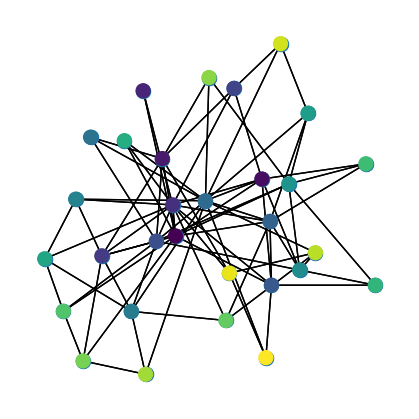

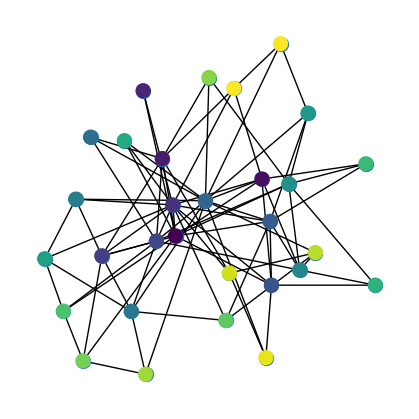

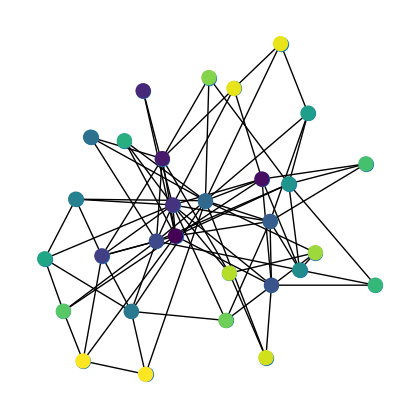

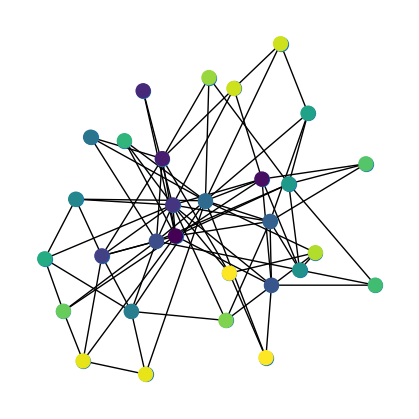

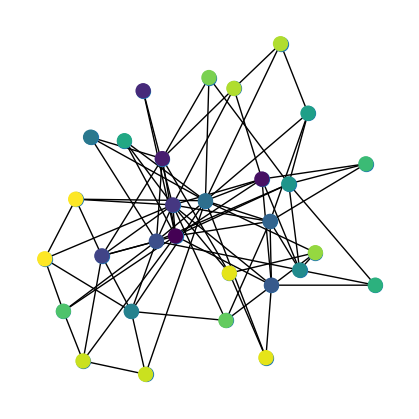

...

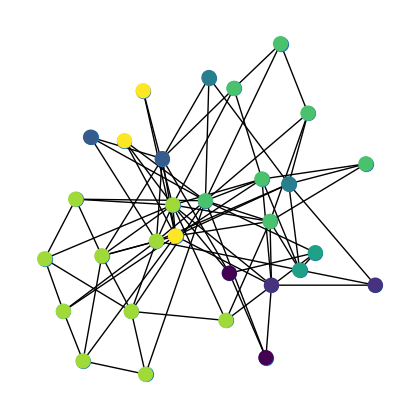

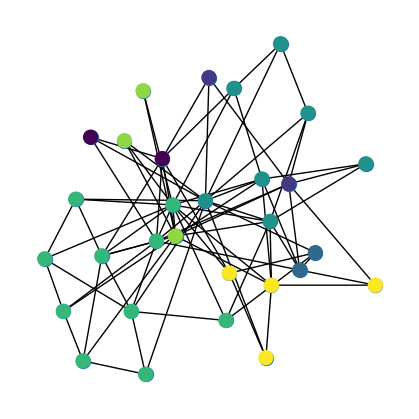

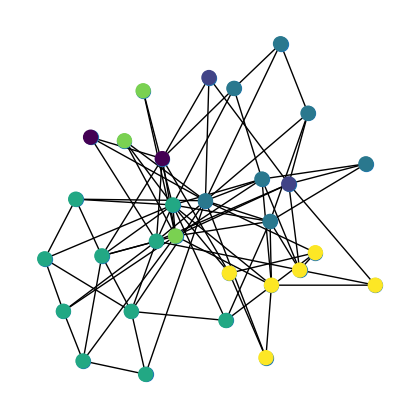

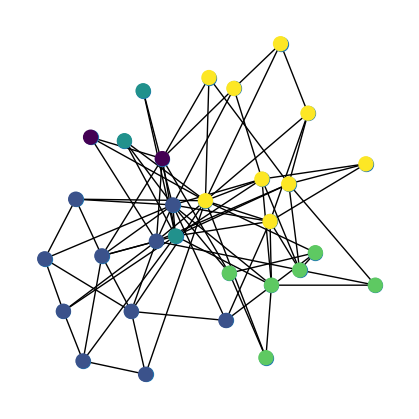

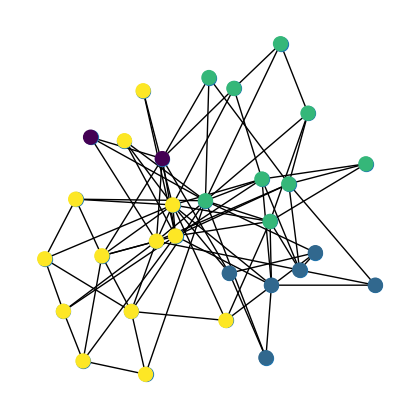

Number of communities: 4
Communities: [[2, 11], [14, 26, 28, 29, 8, 19], [15, 24, 1, 20, 9, 10, 16, 6, 27], [23, 25, 21, 7, 22, 12, 5, 4, 13, 17, 18, 0, 3]]
Modularity: 0.23898795915256818


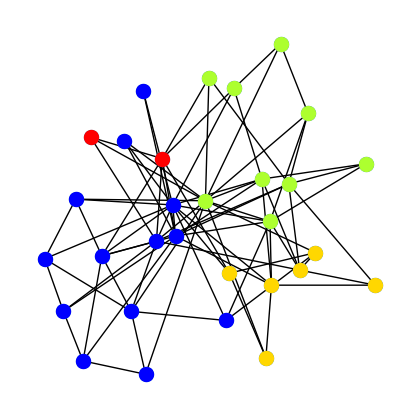

In [276]:
n=30
k=3
G=G=nx.barabasi_albert_graph(n,k)
pos=nx.spring_layout(G)
nx.draw(G, pos, node_size=100)

# Every node is its own community initially.
communities=[]
for i in G.nodes():
    communities.append([i])
    
# Printing the initial modularity:
import networkx.algorithms.community as nx_comm
print(nx_comm.modularity(G, communities))


import networkx.algorithms.community as nx_comm
import matplotlib.pyplot as plt

iteration=0
maxModularity=20
prevModularity=nx_comm.modularity(G, communities)
while maxModularity>0:
    nx.draw(G, pos, node_size=100)
    colors=[]
    for i in G.nodes():
        for j in range(len(communities)):
            if i in communities[j]:
                colors.append(j)
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=G.nodes(), node_color=colors, node_size=100)
    #plt.savefig("./images/les_mis"+str(iteration)+".png", dpi=300)
    plt.show()
    iteration+=1
    maxModularity=-1
    saveI=-1
    saveJ=-1
    for (i,j) in combinations(communities,2):
        communities2=[]
        for k in communities:
            if k!=i and k!=j:
                communities2.append(k)
        communities2.append(i+j)
        if nx_comm.modularity(G,communities2)-prevModularity>maxModularity:
            maxModularity=nx_comm.modularity(G,communities2)-prevModularity
            saveI=i
            saveJ=j
    if maxModularity>0:
        communities2=[]
        for k in communities:
            communities2.append(k)
        communities=[]
        for k in communities2:
            if k!=saveI and k!=saveJ:
                communities.append(k)
        communities.append(saveI+saveJ)
    prevModularity=nx_comm.modularity(G,communities)
    
print("Number of communities:", len(communities))
print("Communities:", communities)
print("Modularity:", nx_comm.modularity(G,communities))
colors = ["red", "gold", "greenyellow", "blue", "purple", "darkviolet", "deeppink", "crimson", "black", "turquoise"]

nx.draw(G, pos, node_size=100)
comm=0
for c in communities:
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=c, node_color=colors[comm], node_size=100)
    comm+=1

Number of communities: 4
Communities: [[2, 11], [14, 26, 28, 29, 8, 19], [15, 24, 1, 20, 9, 10, 16, 6, 27], [23, 25, 21, 7, 22, 12, 5, 4, 13, 17, 18, 0, 3]]
Modularity: 0.23898795915256818


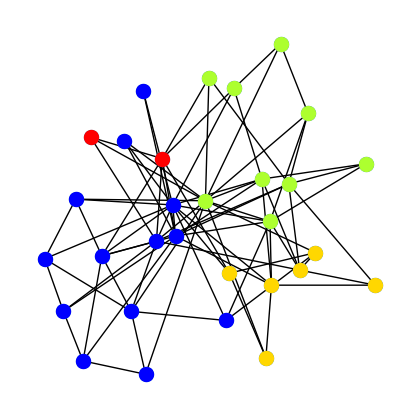

In [277]:
print("Number of communities:", len(communities))
print("Communities:", communities)
print("Modularity:", nx_comm.modularity(G,communities))
colors = ["red", "gold", "greenyellow", "blue", "purple", "darkviolet", "deeppink", "crimson", "black", "turquoise"]

nx.draw(G, pos, node_size=100)
comm=0
for c in communities:
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=c, node_color=colors[comm], node_size=100)
    comm+=1

In [278]:
print(nx_comm.modularity(G, communities))

0.23898795915256818


# Question 3_a<a name = "Question3a"></a>

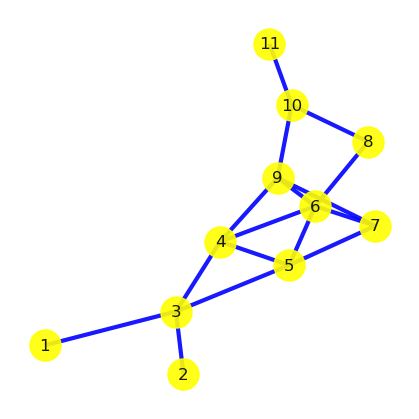

In [279]:
G=nx.Graph()
edgeList=[(1,3),(2,3),(3,4),(3,5),(4,5),(4,6),(4,9),(5,6),(5,7),
         (6,7),(6,8), (6,9),(7,9),(8,10),(9,10),(10,11)
         ]
G.add_edges_from(edgeList)

pos=nx.spring_layout(G)
nx.draw(G,pos, with_labels=True, node_size=500,  node_color='yellow', alpha = 0.9, edge_color = "blue", width = 3)

In [280]:
L=nx.laplacian_matrix(G) ## transfer from G to laplacian matrix
print(L.A)

[[ 1 -1  0  0  0  0  0  0  0  0  0]
 [-1  4 -1 -1 -1  0  0  0  0  0  0]
 [ 0 -1  1  0  0  0  0  0  0  0  0]
 [ 0 -1  0  4 -1 -1 -1  0  0  0  0]
 [ 0 -1  0 -1  4 -1  0 -1  0  0  0]
 [ 0  0  0 -1 -1  5 -1 -1 -1  0  0]
 [ 0  0  0 -1  0 -1  4 -1  0 -1  0]
 [ 0  0  0  0 -1 -1 -1  3  0  0  0]
 [ 0  0  0  0  0 -1  0  0  2 -1  0]
 [ 0  0  0  0  0  0 -1  0 -1  3 -1]
 [ 0  0  0  0  0  0  0  0  0 -1  1]]


In [281]:
eigs,eigvectors=np.linalg.eig(L.A)
print(np.around(eigs,2))
print(np.around(eigvectors,3))

[6.38 5.92 5.25 0.   0.37 0.81 1.   1.7  4.26 3.03 3.28]
[[ 0.046  0.046  0.158  0.302 -0.459  0.33   0.707 -0.121  0.096  0.183
   0.053]
 [-0.25  -0.227 -0.671  0.302 -0.287  0.062  0.     0.084 -0.313 -0.372
  -0.12 ]
 [ 0.046  0.046  0.158  0.302 -0.459  0.33  -0.707 -0.121  0.096  0.183
   0.053]
 [ 0.143  0.638  0.026  0.302 -0.054 -0.218 -0.     0.192  0.33  -0.403
  -0.351]
 [ 0.359 -0.295  0.495  0.302 -0.068 -0.246 -0.     0.244 -0.441 -0.322
   0.159]
 [-0.775 -0.187  0.313  0.302  0.057 -0.281 -0.     0.012  0.279 -0.045
   0.114]
 [ 0.325 -0.512 -0.169  0.302  0.105 -0.229 -0.     0.101  0.391  0.349
  -0.405]
 [ 0.027  0.341 -0.284  0.302  0.035 -0.346 -0.     0.275 -0.182  0.51
   0.471]
 [ 0.216 -0.001 -0.144  0.302  0.245 -0.139 -0.    -0.773  0.11  -0.223
   0.322]
 [-0.169  0.189  0.156  0.302  0.341  0.116  0.    -0.246 -0.527  0.276
  -0.526]
 [ 0.031 -0.038 -0.037  0.302  0.545  0.622  0.     0.352  0.162 -0.136
   0.231]]


In [282]:
def getEigens(L):
    eigvalues,eigvectors=np.linalg.eig(L.A)
    idx = eigvalues.argsort() ## return the sorted index
    return np.around(eigvalues[idx],2), np.around(eigvectors[:,idx],3)

## Here is the sorted version now
eigs,eigvectors=getEigens(L)
print(eigs)
print(eigvectors)

[0.   0.37 0.81 1.   1.7  3.03 3.28 4.26 5.25 5.92 6.38]
[[ 0.302 -0.459  0.33   0.707 -0.121  0.183  0.053  0.096  0.158  0.046
   0.046]
 [ 0.302 -0.287  0.062  0.     0.084 -0.372 -0.12  -0.313 -0.671 -0.227
  -0.25 ]
 [ 0.302 -0.459  0.33  -0.707 -0.121  0.183  0.053  0.096  0.158  0.046
   0.046]
 [ 0.302 -0.054 -0.218 -0.     0.192 -0.403 -0.351  0.33   0.026  0.638
   0.143]
 [ 0.302 -0.068 -0.246 -0.     0.244 -0.322  0.159 -0.441  0.495 -0.295
   0.359]
 [ 0.302  0.057 -0.281 -0.     0.012 -0.045  0.114  0.279  0.313 -0.187
  -0.775]
 [ 0.302  0.105 -0.229 -0.     0.101  0.349 -0.405  0.391 -0.169 -0.512
   0.325]
 [ 0.302  0.035 -0.346 -0.     0.275  0.51   0.471 -0.182 -0.284  0.341
   0.027]
 [ 0.302  0.245 -0.139 -0.    -0.773 -0.223  0.322  0.11  -0.144 -0.001
   0.216]
 [ 0.302  0.341  0.116  0.    -0.246  0.276 -0.526 -0.527  0.156  0.189
  -0.169]
 [ 0.302  0.545  0.622  0.     0.352 -0.136  0.231  0.162 -0.037 -0.038
   0.031]]


## Method 1: partition by hand
### When k = 3

In [283]:
k=3 # number of partitions desired

partition={}
selectedEigvector=eigvectors.T[k-1] # get the eigenvector corresponding to the $k$-th smallest eigenvalue
counter=0
for i in G.nodes():
    partition[i]=selectedEigvector[counter]
    counter+=1
sortedNodes=sorted(partition.items(), key=operator.itemgetter(1))
print(sortedNodes)
print(list(partition.values()))

[(7, -0.346), (6, -0.281), (5, -0.246), (9, -0.229), (4, -0.218), (8, -0.139), (3, 0.062), (10, 0.116), (1, 0.33), (2, 0.33), (11, 0.622)]
[0.33, 0.062, 0.33, -0.218, -0.246, -0.281, -0.229, -0.346, -0.139, 0.116, 0.622]


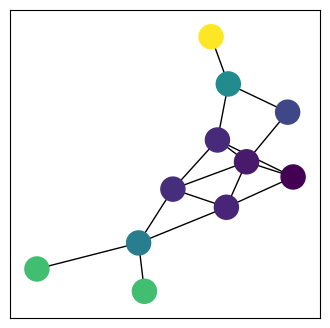

In [284]:
nx.draw_networkx_nodes(G, pos, G.nodes(), node_color=list(partition.values()))
plotting=nx.draw_networkx_edges(G, pos)
plt.show()

In [285]:
k_partition = np.linspace(sorted(partition.values())[0],sorted(partition.values())[-1],k+1,endpoint=True)
k_partition

array([-0.346     , -0.02333333,  0.29933333,  0.622     ])

In [286]:
check_i = {}
for i in list(partition.keys()):
    check_i[i] = 0
check_i

{1: 0, 3: 0, 2: 0, 4: 0, 5: 0, 6: 0, 9: 0, 7: 0, 8: 0, 10: 0, 11: 0}

In [287]:
for i in list(partition.keys()):
    if k == 3:
        if partition[i]> k_partition[2]:
            check_i[i] = 2 
        elif partition[i] < k_partition[1]:
            check_i[i] = 0
        else:
            check_i[i] = 1
    elif k == 2:
        if partition[i]> k_partition[1]:
            check_i[i] = 1
        else: 
            check_i[i] = 0

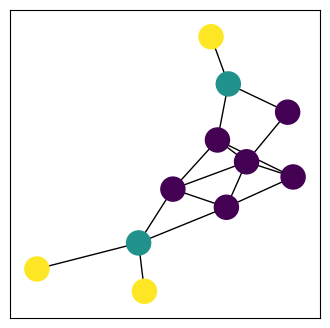

In [288]:
nx.draw_networkx_nodes(G, pos, G.nodes(), node_color=list(check_i.values()))
plotting=nx.draw_networkx_edges(G, pos)
plt.show()

## Method 1: partitioned sklearn
### When k = 2

[(1, -0.459), (2, -0.459), (3, -0.287), (5, -0.068), (4, -0.054), (7, 0.035), (6, 0.057), (9, 0.105), (8, 0.245), (10, 0.341), (11, 0.545)]
[-0.459, -0.287, -0.459, -0.054, -0.068, 0.057, 0.105, 0.035, 0.245, 0.341, 0.545]


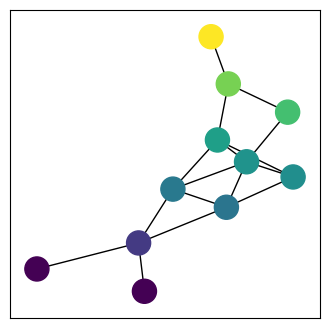

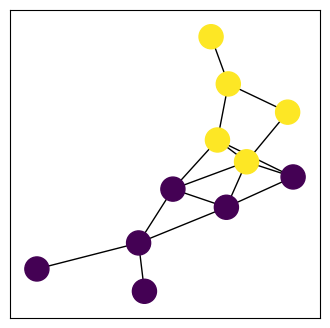

In [289]:
k=2 # number of partitions desired

partition={}
selectedEigvector=eigvectors.T[k-1] # get the eigenvector corresponding to the $k$-th smallest eigenvalue
counter=0
for i in G.nodes():
    partition[i]=selectedEigvector[counter]
    counter+=1
sortedNodes=sorted(partition.items(), key=operator.itemgetter(1))
print(sortedNodes)
print(list(partition.values()))


nx.draw_networkx_nodes(G, pos, G.nodes(), node_color=list(partition.values()))
plotting=nx.draw_networkx_edges(G, pos)
plt.show()

k_partition = np.linspace(sorted(partition.values())[0],sorted(partition.values())[-1],k+1,endpoint=True)
k_partition


check_i = {}
for i in list(partition.keys()):
    check_i[i] = 0
check_i


for i in list(partition.keys()):
    if k == 3:
        if partition[i]> k_partition[2]:
            check_i[i] = 2 
        elif partition[i] < k_partition[1]:
            check_i[i] = 0
        else:
            check_i[i] = 1
    elif k == 2:
        if partition[i]> k_partition[1]:
            check_i[i] = 1
        else: 
            check_i[i] = 0
            
            
nx.draw_networkx_nodes(G, pos, G.nodes(), node_color=list(check_i.values()))
plotting=nx.draw_networkx_edges(G, pos)
plt.show()

### When k = 3

[2 2 2 1 1 1 1 1 0 0 0]


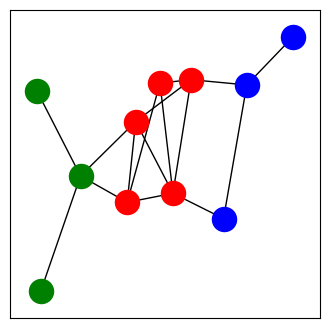

In [290]:
import numpy as np
import networkx as nx
from sklearn.cluster import SpectralClustering ## <- This is new.
from sklearn import metrics
import operator
np.random.seed(1)

my_colors=['blue', 'red', 'green', 'yellow', 'orange', 'purple']

# Set the number of partitions
k=3

# Get adjacency-matrix as numpy-array: needed for sklearn.
adj_mat = nx.to_numpy_matrix(G)
G1=nx.from_numpy_matrix(adj_mat)
pos=nx.spring_layout(G1)


# Identify clusters
sc = SpectralClustering(k, affinity='precomputed', n_init=100, assign_labels='discretize')
sc.fit(adj_mat)

# Print the labels (for checking).
print(sc.labels_)


# Plotting
for j in range(k):
    add_nodes=[]
    for (i,d) in G1.nodes(data=True):
        if sc.labels_[i]==j:
            add_nodes.append(i)
    nx.draw_networkx_nodes(G1, pos, add_nodes, node_color=my_colors[j])    

plotting2=nx.draw_networkx_edges(G1, pos) 

[1 1 1 1 1 0 0 0 0 0 0]


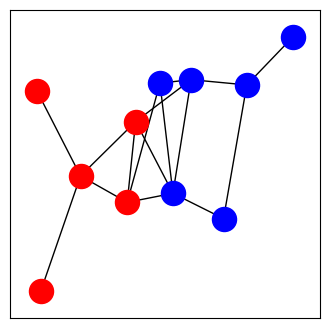

In [291]:
import numpy as np
import networkx as nx
from sklearn.cluster import SpectralClustering ## <- This is new.
from sklearn import metrics
import operator
np.random.seed(1)

my_colors=['blue', 'red', 'green', 'yellow', 'orange', 'purple']

# Set the number of partitions
k=2

# Get adjacency-matrix as numpy-array: needed for sklearn.
adj_mat = nx.to_numpy_matrix(G)
G1=nx.from_numpy_matrix(adj_mat)
pos=nx.spring_layout(G1)


# Identify clusters
sc = SpectralClustering(k, affinity='precomputed', n_init=100, assign_labels='discretize')
sc.fit(adj_mat)

# Print the labels (for checking).
print(sc.labels_)


# Plotting
for j in range(k):
    add_nodes=[]
    for (i,d) in G1.nodes(data=True):
        if sc.labels_[i]==j:
            add_nodes.append(i)
    nx.draw_networkx_nodes(G1, pos, add_nodes, node_color=my_colors[j])    

plotting2=nx.draw_networkx_edges(G1, pos) 

# Question 3_b<a name = "Question3b"></a>

### Using the karate club data

In [292]:
max(coreness.values())

4

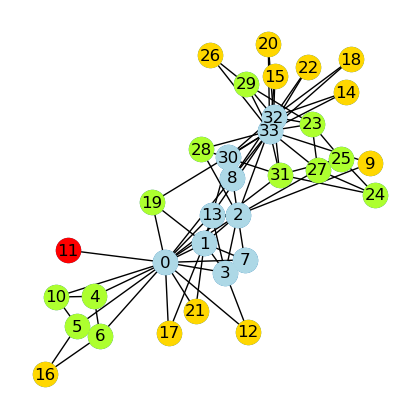

In [293]:
import networkx as nx
G = nx.karate_club_graph()
pos=nx.spring_layout(G)

coreness = nx.core_number(G)

core_index = {}
for i in range(max(coreness.values())):
    core_index[i+1] = []
    
    
for i in list(core_index.keys()):
    for j in coreness.keys():
        if i == coreness[j]:
            core_index[i].append(j) 
            

colors = ["red", "gold", "greenyellow", "lightblue", "purple", "darkviolet", "deeppink", "crimson", "darkgreen", "turquoise"]

nx.draw(G, pos,with_labels=True, node_size=300)
for i in core_index.keys():
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=core_index[i], node_color=colors[i-1], node_size=300)

### Using the les miserables data

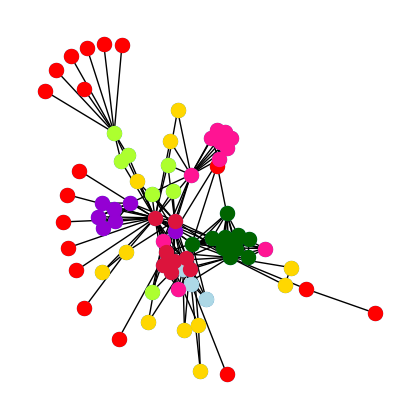

In [294]:
import networkx as nx
G = nx.les_miserables_graph()
pos=nx.spring_layout(G)

coreness = nx.core_number(G)

core_index = {}
for i in range(max(coreness.values())):
    core_index[i+1] = []
    
    
for i in list(core_index.keys()):
    for j in coreness.keys():
        if i == coreness[j]:
            core_index[i].append(j) 
            

colors = ["red", "gold", "greenyellow", "lightblue", "purple", "darkviolet", "deeppink", "crimson", "darkgreen", "turquoise"]

nx.draw(G, pos, node_size=100)
for i in core_index.keys():
    nodes=nx.draw_networkx_nodes(G, pos, nodelist=core_index[i], node_color=colors[i-1], node_size=100)

# Question 4.a<a name = "Question4a"></a>

<font size="4">The algorithm **can not** find a maximum clique. We can see the below graphs G, H, and Q. In graph G, we can find a maximum clique, while in graph H and Q **can not**. The reason why causes the difference is that <font color='red'>the maximum degree of the node in G:{4} is in its maximum clique: {4,5,6} and the length of the second maximum degree of node 2's maximum clique is less than or equal to the maximum clique that contains the maximum degree of nodes</font>. However, in graph H and graph Q, the maximum clique happens in the second or the third maximum degree of nodes.
That is to say, when we have defined a starting searching node (for example, i in step 1), we can not arbitrarily get rid of the useless noded in step1, because maybe the maximum cliques are hidden inside of that.</font>

<font size="4">The worst-case runtime
complexity of the algorithm will be $ \Theta(\frac{|V||V-1|}{2} + |V-1||V-2|\dots|V-k+1|) $, this is because there are $ \Theta(\frac{|V||V-1|}{2}) $ edges to check if we need to find each degree of nodes, in the $ \Theta(|V-1||V-2|\dots|V-k+1|)$, in each step, we need to check with $ |V-k+1| $node. Therefore, if the max clique has included the maximunm degree node, the worst time complexity can be $\Theta(|V-1||V-2|\dots|V-k+1|)$. </font> 

{4: 0.5714285714285714, 2: 0.42857142857142855, 0: 0.2857142857142857, 1: 0.2857142857142857, 3: 0.2857142857142857, 5: 0.2857142857142857, 6: 0.2857142857142857, 7: 0.14285714285714285}


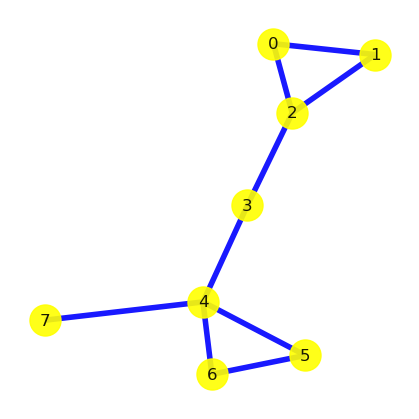

In [295]:
## Graph G
G = nx.Graph()
node_tuple = [(0,1), (0,2), (1,2), (2,3), (3,4), (4,5), (5,6), (4,6), (4,7)]
G.add_edges_from(node_tuple)
pos=nx.spring_layout(G)
nx.draw(G,pos, with_labels=True, node_size=500,  node_color='yellow', alpha = 0.9, edge_color = "blue", width = 4)


degree = nx.degree_centrality(G)
sort_degree = {k: v for k, v in sorted(degree.items(), key=lambda item: item[1], reverse=True)}
print(sort_degree)

{3: 0.5, 4: 0.4, 2: 0.30000000000000004, 0: 0.2, 1: 0.2, 5: 0.2, 6: 0.2, 7: 0.1, 8: 0.1, 9: 0.1, 10: 0.1}


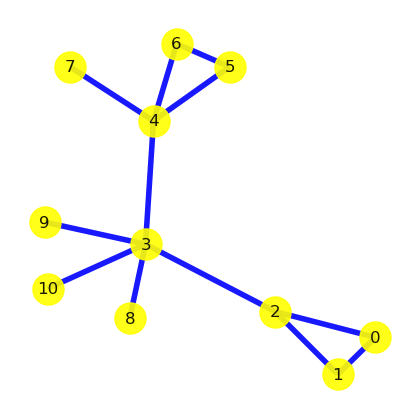

In [296]:
## Graph H
H = nx.Graph()
node_tuple = [(0,1), (0,2), (1,2), (2,3), (3,4), (4,5), (5,6), (4,6), (4,7), (3,8), (3,9), (3,10)]
H.add_edges_from(node_tuple)
pos=nx.spring_layout(H)
nx.draw(H,pos, with_labels=True, node_size=500,  node_color='yellow', alpha = 0.9, edge_color = "blue", width = 4)


degree = nx.degree_centrality(H)
sort_degree = {k: v for k, v in sorted(degree.items(), key=lambda item: item[1], reverse=True)}
print(sort_degree)

{'a': 0.5, 'b': 0.4, 'c': 0.30000000000000004, 'd': 0.2, 'e': 0.2, 'i': 0.1, 'j': 0.1, 'k': 0.1, 'f': 0.1, 'g': 0.1, 'h': 0.1}


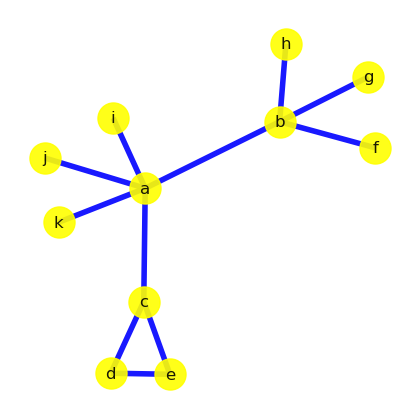

In [297]:
## Graph Q
Q = nx.Graph()
node_tuple = [("a","b"), ("a","c"), ("a","i"), ("a","j"), ("a","k"), ("b","f"), ("b","g"), ("b","h"), ("c","d"), ("c","e"), ("d","e")]
Q.add_edges_from(node_tuple)
pos=nx.spring_layout(Q)
nx.draw(Q,pos, with_labels=True, node_size=500,  node_color='yellow', alpha = 0.9, edge_color = "blue", width = 4)

degree = nx.degree_centrality(Q)
sort_degree = {k: v for k, v in sorted(degree.items(), key=lambda item: item[1], reverse=True)}
print(sort_degree)

# Question 4.b<a name = "Question4b"></a>

<font size="4">Again, we can not produce a maximum clique. I take the below graph S and S1 as examples. Based on the algorithm, in the step1 of the graph S, {8} will be remove at first. Secondly, {0,1} will be removed when k=2. In the third, {2,3} will follow the temp to be removed. Finally, we will find the max clique {4,5,6,7} which k =4. </font>

<font size="4">However, in the graph S1, {8} will be removed in k=1, {0,1,7} will follow the rule, too. In the third, all the remaining nodes: {2,3,4,5,6} will be removed because we can not find a clique in the k3. Consequently, no clique will be found.

<font size="4">The worst-case runtime
complexity of the algorithm will be $ \Theta(\frac{|V||V-1|}{2} + |V-1||V-2|\dots|V-k+1|) $, this is because there are $ \Theta(\frac{|V||V-1|}{2}) $ edges to check if we need to find each degree of nodes, in the $ \Theta(|V-1||V-2|\dots|V-k+1|)$, in each step, we need to check with $ |V-k+1| $node. Therefore, if the max clique has included the maximunm degree node, the worst time complexity can be $\Theta(|V-1||V-2|\dots|V-k+1|)$. </font> 

{4: 0.5, 2: 0.375, 3: 0.375, 5: 0.375, 6: 0.375, 7: 0.375, 0: 0.25, 1: 0.25, 8: 0.125}


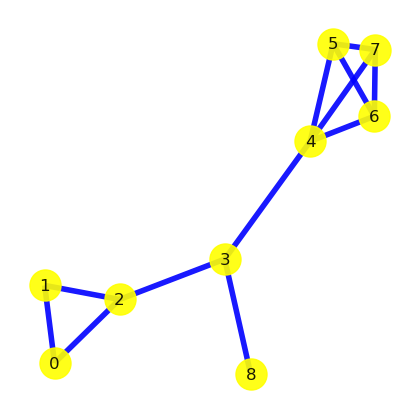

In [298]:
## Graph S
S = nx.Graph()
node_tuple = [(0,1), (0,2), (1,2), (2,3), (3,4), (4,5), (5,6), (4,6), (4,7), (5,7), (6,7), (3,8)]
S.add_edges_from(node_tuple)
pos=nx.spring_layout(S)
nx.draw(S,pos, with_labels=True, node_size=500,  node_color='yellow', alpha = 0.9, edge_color = "blue", width = 4)


degree = nx.degree_centrality(S)
sort_degree = {k: v for k, v in sorted(degree.items(), key=lambda item: item[1], reverse=True)}
print(sort_degree)

{2: 0.375, 3: 0.375, 4: 0.375, 5: 0.375, 6: 0.375, 0: 0.25, 1: 0.25, 7: 0.25, 8: 0.125}


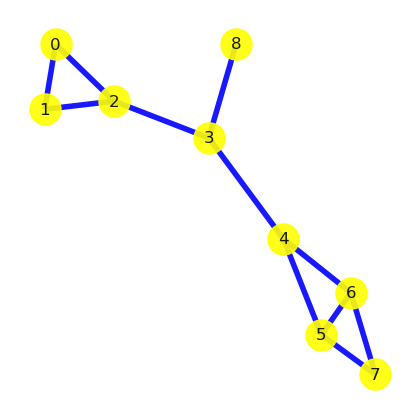

In [4]:
## Graph S
S1 = nx.Graph()
node_tuple = [(0,1), (0,2), (1,2), (2,3), (3,4), (4,5), (5,6), (4,6), (5,7), (6,7), (3,8)]
S1.add_edges_from(node_tuple)
pos=nx.spring_layout(S)
nx.draw(S1,pos, with_labels=True, node_size=500,  node_color='yellow', alpha = 0.9, edge_color = "blue", width = 4)


degree = nx.degree_centrality(S1)
sort_degree = {k: v for k, v in sorted(degree.items(), key=lambda item: item[1], reverse=True)}
print(sort_degree)

# Question 4.c<a name = "Question4c"></a>

<font size="4">The algorithm is likely to find the maximum clique in any graph. Takes 4.b graph S as an example again. In k = 2, all edges can be found. And if we compare the edge (0,2) with (1,0) and (1,2), because the node 1 is the missing node and its connection to node 0 and 2: (1,0), (1,2) can be formed a triangle(k = 2 + 1 = 3), the maximum clique can be {0,1,2}. Respectively, we can generate {4,5,7}, {4,5,6}, {4,6,7}, {5,6,7}. in k = 3. when compared {4,5,7} with  {4,5,6}, {4,6,7},  and {5,6,7}, k increment by 1 will be 4, and the maximum clique will be only one: {4,5,6,7} </font>

<font size="4">The worst-case runtime
complexity of the algorithm will be $ \Theta((\frac{|V||V-1|}{2})\Pi_{k=2}^{k_{max}-1}(|V|-k)(k) $, this is because there are $ \Theta((\frac{|V||V-1|}{2})) $ edges to check if we need to form an edge, and $ \Theta((\Pi_{k=2}^{k_{max}-1}(|V|-k)(k) $ means if we want to form a clique that k larger than or equal to 3, we should compared with $ |V|-k $ nodes, and compared k times with the nodes inside one of the k=1 maxmium clique. $k_{max}$ means how maximum cliques the grpah can be in ideal. The formula is $ k_{max} = find \space k:  \frac{|E|}{k + \frac{C_{k-3}^{k}}{2}}>=1. $  </font> 

{4: 0.5, 2: 0.375, 3: 0.375, 5: 0.375, 6: 0.375, 7: 0.375, 0: 0.25, 1: 0.25, 8: 0.125}


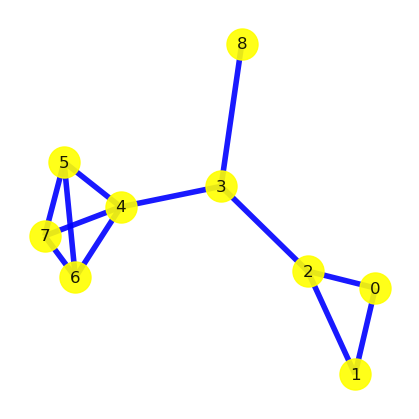

In [299]:
## Graph S
S = nx.Graph()
node_tuple = [(0,1), (0,2), (1,2), (2,3), (3,4), (4,5), (5,6), (4,6), (4,7), (5,7), (6,7), (3,8)]
S.add_edges_from(node_tuple)
pos=nx.spring_layout(S)
nx.draw(S,pos, with_labels=True, node_size=500,  node_color='yellow', alpha = 0.9, edge_color = "blue", width = 4)


degree = nx.degree_centrality(S)
sort_degree = {k: v for k, v in sorted(degree.items(), key=lambda item: item[1], reverse=True)}
print(sort_degree)